# __<font color=blue>swimTRACKING (IMAGEJ TO  PYTHON)</font>__

####  ReadMe:

This Jupyter Notebook will open data from obtained from ImageJ's Trackmate and process it into statistical and graphical outputs. 

##### Download links:
 TrackMate: https://imagej.net/TrackMate \
 ImageJ: https://imagej.net/ij/download.html 
     
 
***
##### INSTRUCTIONS:
1. Follow steps in second block to process data with ImageJ and Trackmate
2. Save all processed ".csv" files in the same folder as this notebook with the following naming convention:
   1. "DD_MM_shortname_any extra identifers.csv"
       - Spacing is key for the convention to work and only '_' will break the string
       - Code has an option to average by None, day or video. If day is chosen, the files where the "DD_MM_shortname" match will be considered as one replicate and pooled prior to averaging. Useful if mutiple samples/videos are taken of the same subject to increase the sample size.
            - Ex: 02_12_CC-125_replicate 1.csv,
            - Ex. 02_12_CC-125_replicate 2.csv
        - If averaging by video chosen, it will not be NOT be pooled by date. Each average will be form one video only. Use if videos taken on the same day are from different samples.
    2.  Can also name as R1_##_shortname_exta indentifiers.csv
        - the purpose is the same, the first five characters serve as an indentifier for what files are from the same sample.
4. Scroll down to the ['EDIT ME HERE!'](#edithere) block. This block contains the most important parameters to fine-tune including the frame rate of tracking (which always must be adjusted), what conditons to use as a control, whether to average by video or day, etc. See block for further instructions.
5. All graphs will be saved in the same local folder as this notebook.

***

#### TRACKMATE INSTRUCTIONS


##### 1: Open video or stack of cells/objects in imageJ:
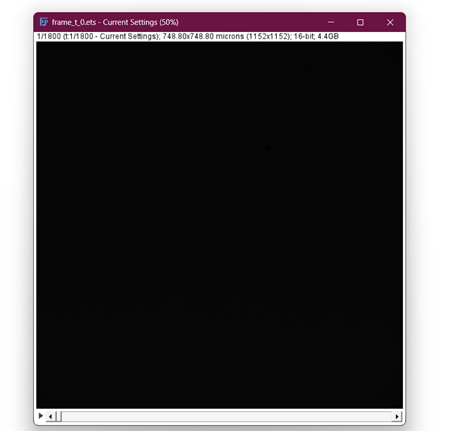

##### 2: Threshold the stack:
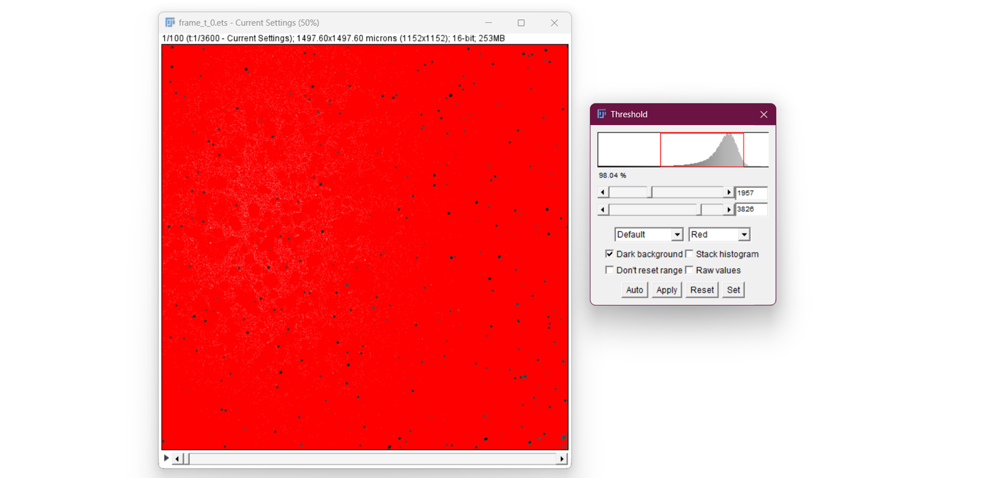

##### 3: Open TrackMate (plugins-> tracking -> TrackMate) and select Hessian detector:
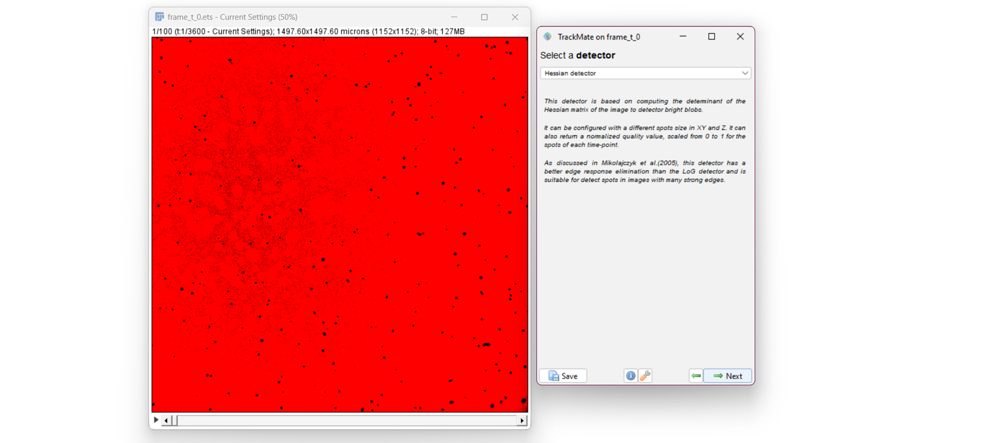
- optimize parameters for objects in hessian detectors, so each object is surrounded by a purple circle
- click next to detect spots
- after detecting spots is finished, do not perform initial thresholding, keep all spots

##### 4 : Select LAP Tracker
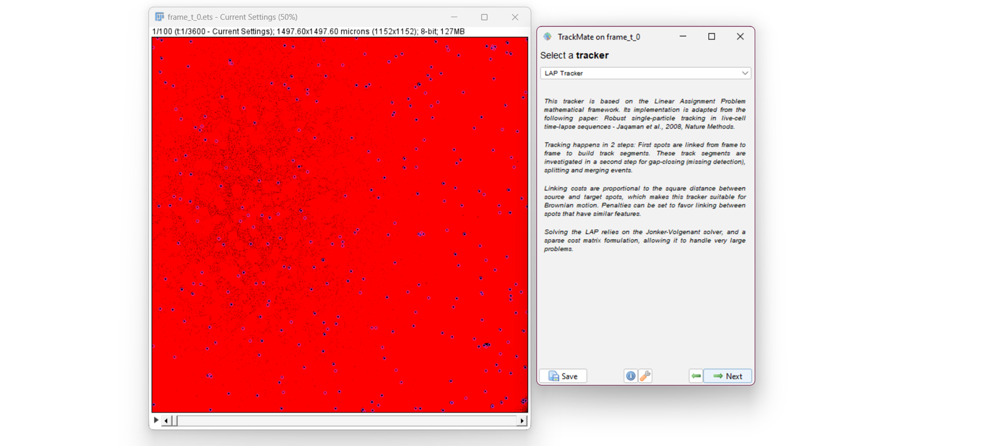
- click next and optimize parameters for object or leave at default (leave "Track Segment Splitting and "Track Segment Merging" unchecked)
- click next to perform tracking

##### 5: View tracks: 
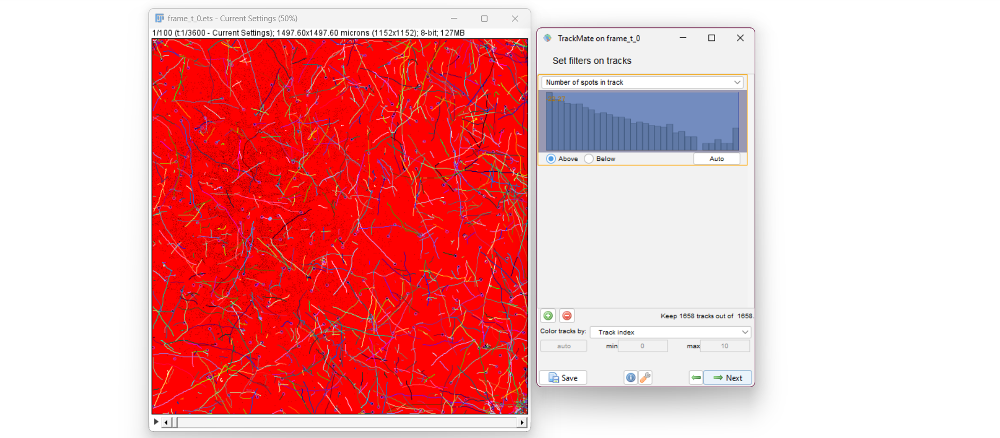
- do not set filter on tracks (code will not work if this is done)

##### 6: Click on the Tracks button
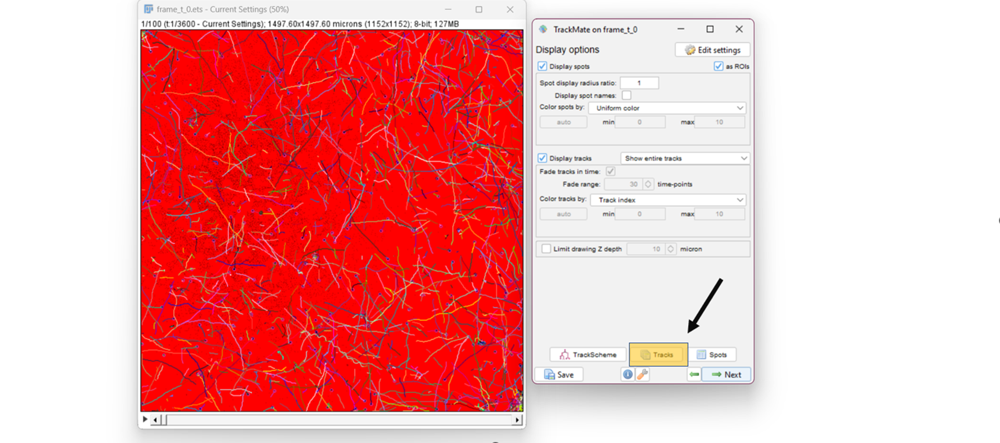

##### 7: In the window that pops up, sort by clicking time then track ID, then save to a CSV
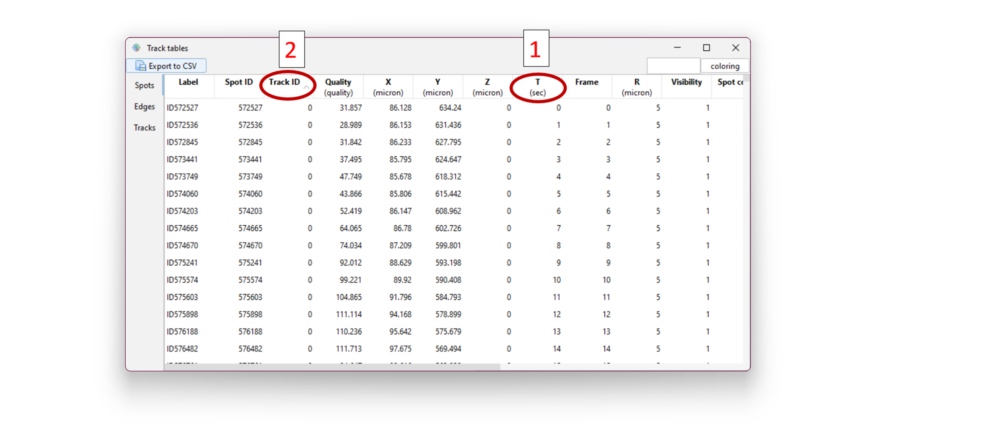


- double check that variables are in the proper order (see below)
    - (note: excel can  retroactively sort, if sorted improperly the first time)
><br>**track time**
<br> 0     0 
<br> 0     1
<br> 0     2
<br> 0     3
<br>1     1
<br>...    ...

- double check that the columns are in the order shown above. Label, spot, track ID... etc. If not then reorder.
    - (note: The column index, not header label is used to import data, so the order must be preserved, or code adjusted.)

#### IMPORTING MODULES

In [1]:
#-----------------------------------------------------------------------------------------------------------------------
import os
import re
import time
import itertools
import math
from csv import reader as csvReader
from math import sqrt
#-----------------------------------------------------------------------------------------------------------------------

#-----------------------------------------------------------------------------------------------------------------------
import numpy as np
import pandas as pd
#-----------------------------------------------------------------------------------------------------------------------

#-----------------------------------------------------------------------------------------------------------------------
import seaborn as sns
#-----------------------------------------------------------------------------------------------------------------------

#-----------------------------------------------------------------------------------------------------------------------
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
from matplotlib import axes
#-----------------------------------------------------------------------------------------------------------------------

#-----------------------------------------------------------------------------------------------------------------------
import scipy
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy.optimize import curve_fit
from scipy.stats import levy_stable
#-----------------------------------------------------------------------------------------------------------------------

#-----------------------------------------------------------------------------------------------------------------------
from scipy.fftpack import fft
from scipy.fftpack import fftfreq
#-----------------------------------------------------------------------------------------------------------------------


#### Functions in this block import external data

In [2]:
def colorBlindSafe(number_categories, palette=None):
    """Function to choose colors for discrete categorical data based on colorblind-safe values.
        Can pass either a number of colors, which will automatically select the colormap with the least number of elements possible
        or can pass palette name to choose the one to use. If passing a 
        palette must choose one with color less than or equal to the number of colors chosen.
       
        Returns:
            list: A list of color tuples representing the chosen colors'
            
        Raises:
            ValueError: If number_categories is less than or equal to 0.
            ValueError: If number_categories is >= lenght of currently selected palette
            TypeError: If number_categories is not an integer.
            TypeError: If palette name is not correct will provide acceptable names
            
    """
    if not isinstance(number_categories, int):
        raise TypeError("The number_categories argument must be an integer.")
    
    if number_categories == 0:
        raise ValueError("The number_categories argument must be greater than 0")
        
    # type error providing the palette names
    if palette not in ['OP', 'PB', 'YB', 'IBM', 'OKABEITO', 'PAULTOL'] and palette is not None:
        raise TypeError("Incorrect palette name. Options are: OP (2), PB (2), YB (2), IBM (5), OKABEITO (8), or PAULTOL (9)")
    
    #High contrast two color lists 
    YB=[(253/255, 179/255, 56/255),
            (2/255, 81/255, 150/255)]
    OP=[(253/255, 97/255, 36/255),
            (2/255, 81/255, 150/255)]
    PB= [(16/255, 85/255, 154/255),
            (219/255, 76/255, 119/255)]
    
    # five elements:
    '''Modified IBM color pallete:
    https://www.ibm.com/design/language/color/#:~:text=Accessibility,-Color%20plays%20a%20key%20role'''
    IBM=[(100/255, 143/255, 255/255),
            (120/255, 94/255, 240/255),
            (220/255, 38/255, 127/255),
            (254/255, 97/255, 0),
            (255/255, 176/255, 0)]
    
    # eight elements
    """ Modified from Okabe and Ito (2008)"""
    OKABEITO=[(255/255, 176/255, 0),
            (34/255, 113/255, 178/255),
            (61/255, 183/255, 233/255),
            (247/255,  72/255, 165/255),
            (53/255, 155/255, 115/255),
            (213/255, 94/255, 0),
            (230/255,159/255,0),
            (240/255, 228/255,66/255)]
    
    # nine elements
    '''Modified from Paul Tol's Muted colors
    https://personal.sron.nl/~pault/'''
    PAULTOL=[(221/255, 221/255, 221/225),
            (46/255, 37/255, 133/255),
            (51/255, 117/255, 56/255),
            (93/255,  168/255, 153/255),
            (148/255, 203/255, 236/255),
            (220/255, 205/255, 125/255),
            (194/255,106/255, 119/255),
            (159/255, 74/255,150/255), 
             (126/255, 41/255,84/255)]
    
    library={"YB": YB, "OP": OP, "PB":PB,  "IBM": IBM, "OKABEITO": OKABEITO, "PAULTOL": PAULTOL}
    
    try:
        color=library[palette] #selecting the palette
    except:
        color=None

    #choosing which elements in the colomap ar returned
    def select_color(lst, num_to_select):
        return [lst[int(i * (len(lst) - 1) / (num_to_select - 1))] for i in range(num_to_select)]

    #When palette is passed
    if color is None and number_categories <= 1:
        color='red'
    elif color is not None:
        if len(color)<number_categories:
            raise ValueError("This palette does not have enough elements for a color list of this length")
        else:
            #selecting approriate number of elements
            color=select_color(color, number_categories)
            
    #selecting optimal map based on number of elements, when palette is absent       
    if color is None and number_categories == 1:
        color='red'
    elif color is None and number_categories < 10: 
        color = min((lst for lst in library.values() if len(lst) >= number_categories), key=len) #choosing optimal color map
        #selecting appropriate number of elements
        color=select_color(color, number_categories)  
    #when too many elements    
    else:
        print("(*Cannot use custom colorblind palette. Defaulting to matplotlib's turbo)")
        cmap=mpl.colormaps.get_cmap("turbo")
        range_color=np.arange(0,1,1/number_categories)
        color=cmap(range_color)    
    return(color)

#-----------------------------------------------------------------------------------------------------------------------
def import_file_names(strainDict=None):
    '''importing file and strain names and making relevant dictionaries

    Arguments:
        strainDict: a dictonary renaming the short names in case special charaters are needed
        
    Returns:
        fileDict: a dictionary of the short names of the files stripped from the on the "DD_MM_shortname_extra.csv" format
        files: a list of the files in local directory'''
    
    fileDirectory = []
    for path, subdirs, files in os.walk(os.getcwd()):
        for name in files:
            if bool(re.search((r'/*.csv'), name)):  #testing if csv data is present
                fileDirectory.append(name)       
    name_directory = [k[6:len(k) - 4].split('_')[0] for k in fileDirectory]  #removing date and ".csv"

    # using zipped list to sort files alphabetically
    list1 = [(name_directory[i], fileDirectory[i]) for i in range(0, len(fileDirectory))]  #read into tuple then 
    order = sorted(list1, key=lambda i: i[0])  #sort by only first tuple element i.e. short file name
    nameList, fileDirectory = zip(*order)

    # renaming the short names based on external dict, any part of string matching will be replaced
    if strainDict is not None:
        updatedNameList = []
        for original_name in nameList:
            updated_name = original_name
            for key, value in strainDict.items():
                if key in original_name:
                    updated_name = updated_name.replace(key, value)
            updatedNameList.append(updated_name)
    nameList = updatedNameList

    # Making a dictionary based on file and (re)named short file names:
    fileDict = {fileDirectory[i]: nameList[i]for i in range(len(fileDirectory))}

    # making color dictionary based off of file names:
    colorDictStrain = {}
    categories = np.unique(nameList) 
    colors = colorBlindSafe(len(categories))
    for i, j in enumerate(colors):
        colorDictStrain[categories[i]] = j
    return fileDict, colorDictStrain, fileDirectory

#-----------------------------------------------------------------------------------------------------------------------
def importOneTrial(fileName,
                   deletion_Criterion=75,
                   frame_time_interval=0.0333333):
    '''
    Function to import imageJ arrays into lists split by track_id of filled with 'TIME', 'X_LOCATION', 'Y_LOCATION' and spped
    
    Inputs: 
        fileName (lst): output of the import_file_names() function
        deletion_Criterion (int): the minimum length in frames per track. Tracks shorter than this discarded. 
        frame_time_interval: the length in seconds of each frame    
    '''
    
    #1. importing data:
    with open(fileName) as csvfile:  #the local name of file in same folder
        data = csvReader(csvfile, delimiter=',')  #\t if tab deliminated file
        for row in data:
            #importing ['TRACK_ID', 'TIME', 'X_LOCATION', 'Y_LOCATION'], if track ID present
            text = [[row[2], row[7], row[4], row[5]] for row in data if row[2]]
    text = text[5:-1]  #removing native ImageJ header

    shortList = []
    for k, g in itertools.groupby(text, key=lambda x: x[0]):
        group_items = list(g)
        if len(group_items) > deletion_Criterion:  #appending if longer than certain amount of seconds
            shortList.append(group_items)
    del text
    
    print(f"Original Track List Length: {k}")
    print(f"Short List Length: {len(shortList)}")

    #6. Must convert into a list of x and list of y values to be compatible with consecutive functions
    XOut, YOut, speedOut, timeOut = [], [], [], []  #output
    for i in range(0, len(shortList)):
        xlist, ylist, speedlist, timeList = [], [], [], []  #placeholders
        for x in range(0, len(shortList[i]) - 1):
            xlist.append(shortList[i][x][2])
            ylist.append(shortList[i][x][3])
            timeList.append(shortList[i][x][1])
            AB = float(shortList[i][x][2]) - float(shortList[i][x + 1][2])
            BC = float(shortList[i][x][3]) - float(shortList[i][x + 1][3])
            speedlist.append(float(sqrt((AB**2) + (BC**2)) / (frame_time_interval)))  #calculating speed for EACH position
        speedOut.append(speedlist)
        xlist.append(shortList[i][-1][2])                 #appending last value
        ylist.append(shortList[i][-1][3])                 #appending last value
        XOut.append([float(i) for i in xlist])            #converting to float
        YOut.append([float(i) for i in ylist])            #converting to float
        timeOut.append([int(float(i)) for i in timeList]) #converting to float
    return XOut, YOut, speedOut, timeOut


#-----------------------------------------------------------------------------------------------------------------------

def splitIntoNonmotile(x, y, speed, time, nonmotile_threshold=10):
    """for one file  at a time takes all valeus and splits into two populations, motile and non-motile based on provided speed threshold
    
    arguments: 
        nonmotile_threshold (int): the speed at which an object is considered immotile,
                                    typically zero is to stringent in microbiological samples due to brownian motion or fluid flow of media. 
                                    Choose relavent threshold for your organism. 
    returns:
        lists of all parameters split into motile or nonmotile"""
    
    #intializing lists
    motileX, motileY, nonmotileX, nonmotileY, motileSpeed, nonmotileSpeed, motileTime, nonmotileTime = ([] for i in range(8)) 
    for i in range(0, len(x)):
        if np.mean(speed[i]) < nonmotile_threshold:  #max displacement
            nonmotileX.append(x[i])
            nonmotileY.append(y[i])
            nonmotileSpeed.append(speed[i])
            nonmotileTime.append(time[i])
        else:
            motileX.append(x[i])
            motileY.append(y[i])
            motileSpeed.append(speed[i])
            motileTime.append(time[i])
    return nonmotileX, nonmotileY, motileX, motileY, motileSpeed, nonmotileSpeed, motileTime, nonmotileTime


#-----------------------------------------------------------------------------------------------------------------------

#### Each function in this block does math to generate features for tracking

In [3]:
#-----------------------------------------------------------------------------------------------------------------------
#MINI HELPER FUNCTIONS: functions called by other functions

def pval(p_value):
    'convert p values to astrixes'
    if p_value == float(1): 
        significance='CTL'
    if p_value < 0.001:
        significance = '***'
    elif p_value < 0.01:
        significance = '**'
    elif p_value < 0.1:
        significance = '*'
    else:
        significance = ' '
    return significance


def wrap_angle(angle):
    #collapses left/right of angle into one dimension 0 to pi
    if angle>180:
        angle = np.deg2rad(360-angle)
    else:
        angle = np.deg2rad(angle)
    return angle

def cohens_effect_size(d1, d2):
    n1, n2 = len(d1), len(d2)
    s1, s2 = np.var(d1, ddof=1), np.var(d2, ddof=1)
    s = sqrt(((n1 - 1) * s1 + (n2 - 1) * s2) /
             (n1 + n2 - 2))  # calculates the pooled standard deviation
    u1, u2 = np.mean(d1), np.mean(d2)  # means
    return (u1 - u2) / s  # calculates the effect size


def split_list_by_indices(data_list, indices, max_gap=2, min_length=2):
    """
    Splits a data list into sublists based on provided indices with a maximum gap and minimum length.
    Fills in the indices within gaps to connect sublists.

    Args:
        data_list (list): The list of values to split.
        indices (list): The list of indices used for splitting.
        max_gap (int, optional): The maximum allowed gap between indices to be considered part
            of the same sublist. Defaults to 1.
        min_length (int, optional): The minimum required length for a sublist to be included
            in the result. Sublists shorter than this length will be omitted. Defaults to 1.

    Returns:
        split_indices (list): A list of sublists where each sublist corresponds to a group of indices
        separated by gaps of no more than max_gap and has a length of at least min_length.
        Indices within gaps are filled in to connect sublists.
        split_values (list): A list of sublists where each sublist corresponds to the values from data_list
        corresponding to the split_indices.
    """
    split_indices = []
    split_values = []
    current_sublist_indices = []
    current_sublist_values = []

    for index in sorted(indices):
        if not current_sublist_indices:
            current_sublist_indices.append(index)
            current_sublist_values.append(data_list[index])
        elif index - current_sublist_indices[-1] <= max_gap:
            current_sublist_indices.extend(range(current_sublist_indices[-1] + 1, index))
            current_sublist_indices.append(index)
            current_sublist_values.extend(data_list[current_sublist_indices[-2] + 1:index])
            current_sublist_values.append(data_list[index])
        else:
            if len(current_sublist_indices) >= min_length:
                split_indices.append(current_sublist_indices)
                split_values.append(current_sublist_values)
            current_sublist_indices = [index]
            current_sublist_values = [data_list[index]]

    if len(current_sublist_indices) >= min_length:
        split_indices.append(current_sublist_indices)
        split_values.append(current_sublist_values)

    return split_indices, split_values

#-----------------------------------------------------------------------------------------------------------------------
# METHODS THAT USE A ROLLING WINDOW OVER TRACK, TO RETURN A LIST OF VALUES
# (most function "CAN" PROCESS ENTIRE TRACK, BUT BEST TO BREAK INTO SEGMENTS OF EQUAL LENGTH FOR EQUAL COMPARISON)
# For example taking the angle of the entire track, would be nearly useless information in most cases,
# but taking it in windows is very useful

def calculate_Angle(A, B, C, interval, frame_time_interval):
    """
    Calculates the angle (theta) betweend three coordinates provided as tuples or lists in format (X,Y).
    
     Returns:
        angle (int):
        average_speed (int): the average speed of this angle 
    """
    AB = sqrt(((B[0] - A[0])**2) + ((B[1] - A[1])**2))  #distance
    BC = sqrt((C[0] - B[0])**2 + (C[1] - B[1])**2)      #distance
    AC = sqrt((C[0] - A[0])**2 + (C[1] - A[1])**2)       #total displacement

    deg1 = (360 + math.degrees(math.atan2(A[1] - B[1], A[0] - B[0]))) % 360
    deg2 = (360 + math.degrees(math.atan2(C[1] - B[1], C[0] - B[0]))) % 360

    speed_conversion = (interval * frame_time_interval)
    average_speed = (AB + BC) / (speed_conversion)

    angle = 0 if (deg1 == 0 and deg2 == 0) else ((deg2 -
                                                  deg1) if deg1 <= deg2 else
                                                 (360 - (deg1 - deg2)))
    return angle, average_speed


def directness(xlist, ylist):
    """Calculates the directness of an object's track, AKA the confinement ratio:
    Returns:
        directness (int): euclideanDistance/accumulatedDistance
        elucideanDistance (int): distance from first to last coordinate
        accumulatedDistance (int): total distance an object has travelled in each step
    """
    elucideanDistance = sqrt(((xlist[0] - xlist[-1])**2) +
                             ((ylist[0] - ylist[-1])**2))
    accumulatedDistance = 0.00001  #to avoid divide by zero issues. A very small number is initiated
    
    for i in range(0, len(xlist) - 1):
        accumulatedDistance += sqrt(((xlist[i] - xlist[i + 1])**2) +
                                    ((ylist[i] - ylist[i + 1])**2))
        directness = elucideanDistance / accumulatedDistance
    return float(directness), float(elucideanDistance), float(accumulatedDistance)
    
#--------------------------------------------------------------------------------------------------------------------
def cell_count(time_list):
    """Find the number of cells at each discrete time point
    Returns:
        counts (list): sequential list of number of tracked cells over time.
    """
    # Flatten the time_list to get a list of all timepoints
    all_timepoints = [time_point for sublist in time_list for time_point in sublist]
    # Determine start_time and end_time
    start_time = min(all_timepoints)
    end_time = max(all_timepoints)

    # Initialize a dictionary to store counts at each timepoint
    count_dict = {}
    for sublist in time_list:
        for time_point in sublist:
            count_dict.setdefault(time_point, 0)
            count_dict[time_point] += 1
    counts = [count_dict.get(time, 0) for time in range(start_time, end_time + 1)]
    return counts

#-----------------------------------------------------------------------------------------------------------------------
def stepwise_features_rolling_per_track(xlist, ylist, speedlist, timelist, window_size,
                                        strain, file, frame_time_interval):
    '''For each file, processes track features using a rolling window or applicable method
    Returns:
         PROCESSED_LIST (list): a list of mixed datatypes, some integers, where each motile track has been individual processed
         0. file (str)
         1. timelist[z] (list)
         2. PROCESSED_angle (list)
         3. speedlist[z] (list)
         4. PROCESSED_whole_directness (int)
         5. PROCESSED_rolling_directness (list)

         #these statistics are specific to describing whenn cells cionvert to the symmetric beat, reversing the cell orientation briefly
         8. boolean_indices (list) 
         9. number_reversal (int)
         10. length_normalized_reversal (int)
         11. percent_track_in_reversal (int)
         12. time_between_reversal (int)
         '''
    PROCESSED_LIST = []
    for z in range(len(xlist)):
        x = xlist[z]
        y = ylist[z]
        PROCESSED_rolling_directness= []
        PROCESSED_directness, PROCESSED_angle, PROCESSED_speed = [], [], []
        # Setting up a rolling window
        for i in range(0, len(x) - 1):
            # Handling instances where the position of track is smaller than the window by shrinking window. 
            #Otherwise code will throw an error.
            #Suggested to carefully consider use for datasets with a short number of tracked points per trajectory 
            #as edge effects may have large impact on dataset validity
            if (i - window_size) < 0:
                window_upper = window_size
                window_lower = window_size + (i - window_size)
            elif (i + window_size) >= len(x):
                window_upper = len(x) - i - 1
                window_lower = window_size
            else:
                window_lower = window_size
                window_upper = window_size
            # Calling functions
            directed, total, accumulated = directness(
                x[i - window_lower:i + window_upper],
                y[i - window_lower:i + window_upper])
            A, B, C = (x[i - window_lower], y[i - window_lower]), (x[i], y[i]), (x[i + window_upper],y[i + window_upper])
            angle, speed = calculate_Angle(A, B, C,(window_lower + window_upper), frame_time_interval)
        
            # Appending results
            PROCESSED_rolling_directness.append(directed)
            PROCESSED_angle.append(angle)

        # METRICS USING ENTIRE TRACK
        #timeTrack=(len(x)*frame_time_interval) #data quality control,  uncomment and add into the PROCESSED_LIST output for debugging
        PROCESSED_whole_directness, _, _ = directness(x, y)
        boolean_indices, number_reversal, length_normalized_reversal, percent_track_in_reversal, time_between_reversal =track_in_reversal(speedlist[z], PROCESSED_angle, timelist[z], frame_time_interval, x, y)

        #SOME METRICS CALLED DIRECTLY FROM IMAGEJ ARRAY
        PROCESSED_LIST.append([file, timelist[z], PROCESSED_angle, speedlist[z], PROCESSED_whole_directness, PROCESSED_rolling_directness,
             boolean_indices, number_reversal, length_normalized_reversal, percent_track_in_reversal, time_between_reversal])
    return PROCESSED_LIST

#### Each function in this block will generate one (or more) graphical output

In [4]:
def rayleigh_circularity(x, y, graph_plot=False, replicate=None):
    """
    Testing if tracking data in one experiment is circular or not using Rayleigh circularity criterion 
    Args:
        x (list): the final X coordinate positions
        y (list): the final Y coordinate positions
        graph_plot (bool): a function to debug if the cartesian coordiantes are being converted  to polar correctly
        replicate (str): name of current trial/ replcate for printing debug line for if data is circularor not
    Options:
        graph_plot: quality control to allow visualization of endpoints and distrubution to confirm proper conversion to polar coordinates. 
    Returns:
        rayleigh_statistic: calculated by stat test
        p_value: if the statistic indicates significant circularity
             
    """
    # Converting Cartesian to polar coordinates:
    lengths = np.sqrt(np.array(x)**2 +
                      np.array(y)**2)  # Calculate lengths from origin [0,0]
    angles = np.arctan2(y, x)
    angles[angles < 0] += 2 * np.pi  # Ensure angles are in [0, 2*pi]

    if graph_plot == True:
        # Create a scatter plot of Cartesian data to check for sucessful conversion
        plt.figure(figsize=(8, 8))
        plt.scatter(x, y, marker='o', color='blue', label='Cartesian Data')
        plt.axhline(0, color='black', linewidth=0.5, linestyle='--')
        plt.axvline(0, color='black', linewidth=0.5, linestyle='--')
        plt.gca().set_aspect('equal', adjustable='box')
        plt.title("Uniform Random Data in Cartesian Coordinates")
        plt.xlabel("X")
        plt.ylabel("Y")
        plt.legend()

        # Create a circular plot of polar data
        plt.figure(figsize=(8, 8))
        plt.polar(angles, lengths, marker='o', linestyle='None', color='red')
        plt.title("Converted Polar Data on Circular Plot")
        plt.grid(True)
        plt.show()

        # Create a polar histogram
        plt.figure(figsize=(8, 8))
        n, bins, patches = plt.hist(angles,
                                    bins=np.linspace(0, 2 * np.pi, 360),
                                    density=True,
                                    color='blue',
                                    edgecolor='black')
        # Create a polar plot with the histogram data
        ax = plt.subplot(111, projection='polar')
        ax.plot(bins, np.append(n, n[0]), color='blue', linewidth=2)
        ax.fill_between(bins, np.append(n, n[0]), alpha=0.3, color='blue')
        # Set zero angle at the top of the plot
        ax.set_theta_direction(-1)
        ax.set_theta_offset(np.pi / 2.0)
        plt.title("Polar Histogram of Angles")
        plt.grid(True)
        # Show the plot
        plt.show()

    # Compute the mean resultant length
    mean_resultant_length = np.abs(np.mean(np.exp(1j * angles)))
    # Compute the Rayleigh test statistic
    rayleigh_statistic = len(angles) * mean_resultant_length**2
    # Compute the p-value using the Rayleigh distribution
    p_value = 1 - scipy.stats.rayleigh.cdf(rayleigh_statistic, loc=0, scale=1)
    if replicate is not None:
        if p_value < 0.05:
            print("Reject the null hypothesis of Rayleigh circularity: Data is not uniformly distributed. May want to recollect data under uniform conditions or consider that movement/taxis is occuring")
    return rayleigh_statistic, p_value

#-----------------------------------------------------------------------------------------------------------------------

def PCA_PLOT(df1, colorDict, fileDict):
    '''Principal component analysis of track features. Will plot output colored by strain
    
    Returns:
        graph 1: the vectors of PCA
        graph 2: the scatterplot of each element after PCA
    '''
    df1 = df1.fillna(0)
    #normalizing for PCA
    df_normalized = (df1 - df1.mean()) / df1.std()
    df_normalized = df_normalized.fillna(0)
    scaler = StandardScaler()
    scaler.fit(df1)
    scaled_data = scaler.transform(df1)
    pca = PCA(n_components=2)
    x_pca = pd.DataFrame(pca.fit_transform(scaled_data), columns=['X1', 'X2'])
    x_pca['category'] = df1.index
    x_pca = x_pca.set_index(['category'])
    x_pca['color'] = df1.index.to_series().map(colorDict)

    # plot vectors
    plt.figure()
    ax = plt.gca()
    names = list(df1.columns)
    for length, vector in zip(pca.explained_variance_, pca.components_):
        v = vector * 3 * np.sqrt(length)
    for i in range(len(v)):
        plt.plot([0, v[i]], [0, pca.mean_[i]])
        plt.text(v[i], pca.mean_[i], str(names[i]), fontsize=10)

    #plotting data
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111)
    for label in np.unique(x_pca.index):
        plt.scatter(x_pca.loc[label]['X1'],x_pca.loc[label]['X2'],
                    label=label, s=2, c=x_pca.loc[label]['color'])
    plt.xlabel('First Principal Component')
    plt.ylabel('Second Principal Component')
    plt.gca().legend(colorDict.keys(),
                     title="Strains",
                     loc='center left',
                     bbox_to_anchor=(1.05, 0.5),
                     markerscale=6)
    plt.show()


#-----------------------------------------------------------------------------------------------------------------------


def graphTrack(x, y, frame_time_interval, rolling_window_interval,
               color='b', colorBy=None, annotate=False,
               plot_at_zero=True, max_color_speed=None, ax=None):
    
    ''' Function designed to visualize output of 1 or multiple cell tracks at a time, and color by a calculated parameter
    
    args:
        x (list): x coordinates
        y (list):  y coordinates
        time_frame_interval (int): passing the global parameter of frame interval
        rolling_window_interval (int): passing global parameter, which will be used to wrap angle colors correctly
        color (a matplotlib color string, or a list of colors): will be uses to color each track
        colorBy (str):
            Options:
            1. 'time' : when flagged will color using time appropriate labels, ranges and parameters
            2. 'angle': when flagged will color using angle appropriate labels, ranges and parameters
            3. 'speed': when flagged will color using speed appropriate labels, ranges and parameters
        annotate (str): will add annotation to the start of each track, [suggested: track number, start time etc..]
        plot_at_zero (bool):  if <True> all tracks will be recalculated to start at [0,0], ideal to view diffsion or directional bias
        max_color_speed (int): sets the upper bounds of the mapping by color
        ax (Matplotlib.axes): an axes object to plot the graph to
        
    '''
    if color is list and colorBy is None:
        raise ValueError("if a list of values is passed, a colorBy argument must be selected")
    if color is str and colorBy is not None:
        raise ValueError("if a colorBy argument is selected, a list of colors to map bust be passed using the 'color' parameter")
        
    if ax is None:
        ax = plt.gca()

    x1 = [float(i) for i in x]  # converting to float to do math
    y1 = [float(i) for i in y]  # converting to float to do math

    if plot_at_zero == True:
        x1 = [element - int(x1[0]) for element in x1]
        y1 = [element - int(y1[0]) for element in y1]
        

    ax.plot(x1, y1, alpha=0.1, color='b')
    ax.set_xlabel('x position (\u03BCm)')
    ax.set_ylabel('y position (\u03BCm)')
    endStr = "%.2f" % (len(x1) * frame_time_interval)
    if plot_at_zero == True:
        x1 = [element - int(x1[0]) for element in x1]
        y1 = [element - int(y1[0]) for element in y1]
    if annotate == True:
        ax.text(x1[len(x1) - 1] + 2,
                y1[len(x1) - 1] - 8,
                "t=" + endStr,
                fontsize=6,
                color=color)
        ax.text(x1[1] + 2, y1[1] + 8, "t=0", fontsize=6, color=color)
    if colorBy == "reversal":
        for position in range(0, (len(x) - 1)):
            ax.plot(x1[position - 1:(position) + 1], y1[position - 1:(position) + 1], alpha=0.9, color=color[position - 1])
        legend_elements = [mpl.lines.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Not in Reversal'),
                           mpl.lines.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='In Reversal')]
        # Create a custom legend
        ax.legend(handles=legend_elements, loc='upper right')

    elif colorBy == "speed":  # must use the speed calculated by trackmate, as the speed I calculate changes by interval size. Trackmatespeed/0.033333 to convert
        #setting colors
        my_cmap = plt.cm.get_cmap('jet')
        if max_color_speed == 'max':
            max_color_speed = np.max(np.max(color))
        data_color = [x / max_color_speed for x in color
                      ]  # scaling to max speed passed, for consitent size
        colors = my_cmap(data_color)
        for position in range(1, (len(x) - 1)):
            x = [x1[position - 1], x1[position]]
            y = [y1[position - 1], y1[position]]
            ax.plot(x, y, alpha=0.9, color=colors[position])
        if len(plt.gcf().axes) == 1:
            sm = ScalarMappable(cmap=my_cmap,
                                norm=plt.Normalize(0, max_color_speed))
            sm.set_array([])
            cax, cbar_kwds = mpl.colorbar.make_axes(ax,
                                                    location='right',
                                                    fraction=0.05,
                                                    pad=0.06,
                                                    shrink=0.8,
                                                    aspect=20)
            cbar = mpl.colorbar.ColorbarBase(ax=cax,
                                             cmap=my_cmap,
                                             extend='both',
                                             norm=plt.Normalize(
                                                 0, max_color_speed),
                                             spacing='proportional',
                                             orientation='vertical')
            cbar.set_label('Speed (\u03BCm⋅s\u207B\u00B9)',
                           rotation=270,
                           labelpad=20)

    elif colorBy == "time":
        my_cmap = plt.cm.get_cmap('jet')
        data_color = [x / max_color_speed
                      for x in color]  #scaling to max value passed, in frames
        colors = my_cmap(data_color)
        for position in range(0, (len(x) - 1)):
            x = [x1[position], x1[position + 1]]
            y = [y1[position], y1[position + 1]]
            ax.plot(x, y, alpha=0.9, color=colors[position])
        if len(plt.gcf().axes) == 1:
            sm = ScalarMappable(cmap=my_cmap,
                                norm=plt.Normalize(0, max_color_speed))
            sm.set_array([])
            cax, cbar_kwds = mpl.colorbar.make_axes(ax,
                                                    location='right',
                                                    fraction=0.05,
                                                    pad=0.06,
                                                    shrink=0.8,
                                                    aspect=20)
            cbar = mpl.colorbar.ColorbarBase(ax=cax,
                                             cmap=my_cmap,
                                             extend='both',
                                             norm=plt.Normalize(
                                                 0, max_color_speed),
                                             spacing='proportional',
                                             orientation='vertical')
            cbar.set_label('time (sec)', rotation=270, labelpad=20)

    elif colorBy == 'angle':
       #setting colors
        my_cmap = plt.cm.get_cmap('jet')
        if max_color_speed == 'max':
            max_color_speed = np.max(np.max(color))
        data_color = [x / max_color_speed for x in color
                      ]  # scaling to max speed passed, for consitent size
        colors = my_cmap(data_color)
        for position in range(1, (len(x) - 1)):
            x = [x1[position - 1], x1[position]]
            y = [y1[position - 1], y1[position]]
            ax.plot(x, y, alpha=0.9, color=colors[position])
        if len(plt.gcf().axes) == 1:
            sm = ScalarMappable(cmap=my_cmap,
                                norm=plt.Normalize(0, max_color_speed))
            sm.set_array([])
            cax, cbar_kwds = mpl.colorbar.make_axes(ax,
                                                    location='right',
                                                    fraction=0.05,
                                                    pad=0.06,
                                                    shrink=0.8,
                                                    aspect=20)
            cbar = mpl.colorbar.ColorbarBase(ax=cax,
                                             cmap=my_cmap,
                                             extend='both',
                                             norm=plt.Normalize(
                                                 0, max_color_speed),
                                             spacing='proportional',
                                             orientation='vertical')
            cbar.set_label('Angle (θ)',
                           rotation=270,
                           labelpad=20)
    else:
        ax.plot(x1, y1, alpha=1, color=color)
        
#-----------------------------------------------------------------------------------------------------------------------

def rose_plot(angleList,
              totalCells,
              speedList,
              bins=25,
              density=None,
              lab_unit="degrees",
              colorbar_plot=True,
              max_color_speed=150,
              ax=None):
    """ 
    Plot polar histogram of angles on ax. 
    """
    
    if ax is None:
        fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
        ax.set_theta_offset(-np.pi / 2)

    if ax.name != 'polar':
        raise TypeError("Axes must be created using subplot_kw=dict(projection='polar')")

    binnedSpeed, binnedAngle = [], []
    if not isinstance(angleList[0], list):
        length = 1
    else:
        length = len(angleList)
    for z in range(0, length):
        angles = angleList[z]
        speed = speedList[z]
        if not isinstance(angleList[0], list):
            angles = angleList
            speed = speedList
        if lab_unit == "degrees":
            angles = np.array([math.radians(i) for i in angles
                               ])  #must be in rads to do next math
        # Wrap angles to [-pi, pi]
        angles = (angles + np.pi) % (2 * np.pi) - np.pi
        # Bin data and record counts
        count, bin = np.histogram(
            angles,
            bins=bins)  #defining the bin intervals based on input [-3.14:3.14]
        count = [i / sum(count) for i in count]  #norming to one under curve
        binnedAngle.append(count)

        #calculating speed in bin given by hist:
        speedByBin = []
        stdByBin = []
        placeholdbin = []
        for i in range(0, bins):
            for x in range(0, len(angles)):
                if (bin[i]) <= angles[x] <= (
                        bin[i + 1]
                ):  #testing if each angle is between a specified bin, and appending its speed
                    placeholdbin.append(speed[x])
            speedByBin.append(np.mean(placeholdbin))
            stdByBin.append(np.std(placeholdbin))
            placeholdbin = []
            # Compute width of each bin
        widths = np.diff(bin)
        binnedSpeed.append(speedByBin)
    np.array(binnedSpeed)
    averageSpeed = np.mean(np.array(binnedSpeed), 0)
    averageAngleCount = np.mean(np.array(binnedAngle), 0)
    stdAngleCount = np.std(np.array(binnedAngle), 0)

    #setting colors
    my_cmap = plt.cm.get_cmap('turbo')
    #setting colorbar:
    if max_color_speed == 'max':
        max_color_speed = np.max(np.max(averageSpeed))
    data_color = [x / max_color_speed for x in averageSpeed]  #may be setting
    colors = my_cmap(data_color)
    if colorbar_plot is True:
        bounds = ([0, 25, 50, 75, 100, 125, 150])
        sm = ScalarMappable(cmap=my_cmap,
                            norm=plt.Normalize(0, max_color_speed))
        sm.set_array([])
        cax, cbar_kwds = mpl.colorbar.make_axes(ax,
                                                location='right',
                                                fraction=0.05,
                                                pad=0.05,
                                                shrink=0.7,
                                                aspect=20)
        cbar = mpl.colorbar.ColorbarBase(ax=cax,
                                         cmap=my_cmap,
                                         extend='both',
                                         norm=plt.Normalize(
                                             0, max_color_speed),
                                         ticks=bounds,
                                         spacing='proportional',
                                         orientation='vertical')
        cbar.set_label('Speed (\u03BCm⋅s\u207B\u00B9)',
                       rotation=270,
                       labelpad=20)

    # Plot data on POLAR ax
    ax.bar(bin[:-1],
           averageAngleCount,
           zorder=1,
           align='edge',
           width=widths,
           edgecolor='k',
           linewidth=0.1,
           color=colors,
           yerr=stdAngleCount,
           error_kw=dict(elinewidth=0.5))
    maxlim = round(max(count) * 10) / 10
    ax.set_yticks([maxlim / 2, maxlim])
    ax.set_rlabel_position(0)
    ax.set_ylim(bottom=0)
    ax.set_theta_offset(-np.pi / 2)
    if lab_unit == "radians":
        label = [
            '$0$', r'$\pi/4$', r'$\pi/2$', r'$3\pi/4$', r'$\pi$', r'$5\pi/4$',
            r'$3\pi/2$', r'$7\pi/4$'
        ]
        ax.set_xticklabels(label)
    plt.text(0.5,
             -0.17,
             f"N={totalCells}",
             ha="center",
             fontsize=18,
             transform=ax.transAxes)
    return my_cmap

#-----------------------------------------------------------------------------------------------------------------------

def track_in_reversal(speeds, angles, frames, frame_time_interval, x=None, y=None):
    '''
    Purpose: To find and return stats describing the reversal events in Chlamydomonas reinhardtti based on
            changes in angle and speed. 
            This has been optimized for 20x, 33 FPS. May not be accurate if changes in frame rate, objective,
            bit size are used.
    
    Arguments:
        angles: (list) of angles
        speeds: (list of track speeds)
        frames: (list) frames at those angles and speeds
    
    Returns:
        reversal_boolean: (list) a list of reversal T/F for all timepoints passed
        number of reversal: (int) count of reversal in track. if no reversal events, returns 0. 
        length_normalized_reversals: (int) count of reversal/ track length. if none returns 0. 
        percent_track_in_reversal: (int) time of reversal tracks/time entire track. if no reversal returns 0%
        time_between_reversals: (int) if multiple reversals per track returns the time between these two events. Else N/A. 
    '''
    
    reversal_boolean=[]
    indices_with_condition = [] 
    sublist_index=[] 
    total_indices=[]
    
    number_reversal=0
    length_normalized_reversals=0
    percent_track_in_reversal=0

    #PREPROCESSING DATA
    angles=[wrap_angle(i) for i in  angles] # wrapping to zero and pi 
    timeList_corrected=[i*frame_time_interval for i in frames]
                    
    # FINDING FORWARD SPEED (when angle is 150-210°)  
    forward_indices = [i for i, angle in enumerate(angles) if angle > (5*np.pi/6)]
    forward_speed=0
    forward_speed = [speeds[i] for i in forward_indices]
    trim_speed=scipy.stats.trim_mean(forward_speed, 0.25) 
    if forward_speed==0:
        print('cannot calculate forward speed')
    
    #1: split indices into list of lists based solely on speed
    for z in range(len(speeds)):
        if (speeds[z] < 0.75 * trim_speed) == True: #checking if speed decreases
            if not sublist_index:
                sublist_index=[z] #setting first element
            elif (z-sublist_index[-1])==1: #if indices are subsequent
                sublist_index.append(z)
            else:
                if len(sublist_index)>1: #speed decrease of at least 2 frames
                    LAST_INDEX=sublist_index[-1]
                    if (LAST_INDEX+1)<len(speeds):
                        sublist_index.append((LAST_INDEX+1)) #appending one extra 'buffer' index, if that index exists
                    indices_with_condition.append(sublist_index) #external append
                sublist_index=[z] #starting new list
    indices_with_condition.append(sublist_index) #appending last instance. 
    indices_before_gap=([element for sublist in indices_with_condition for element in sublist])

    #2. Sealing gaps in lists that have speed decreases of less than half average length of the two segments
    if indices_with_condition:
        sealed_list = []
        current_segment = indices_with_condition[0]
        for sublist in indices_with_condition[1:]:
            # Check the gap between the last frame of the current segment and the first frame of the next sublist
            gap = sublist[0] - current_segment[-1]
            gap_lenght=math.ceil((len(sublist)+ len(current_segment))/8) #gap cannot be greater than half average length
            if gap <= gap_lenght:
                gap_fill=np.array(range(1, gap))+current_segment[-1]
                # Merge the sublists
                current_segment.extend(gap_fill)
                current_segment.extend(sublist)
            else:
                # Start a new segment
                sealed_list.append(current_segment)
                current_segment = sublist
        sealed_list.append(current_segment)
    else:
        sealed_list=[]
    indices_with_condition=([element for sublist in sealed_list for element in sublist])

    split_indices, split_values=(split_list_by_indices(angles, indices_with_condition,  max_gap=1))
    indices_with_condition=([element for sublist in sealed_list for element in sublist])
   
    
    for sublist_indices, sublist_values in zip(split_indices, split_values):
        speed_at_indices=[speeds[i] for i in sublist_indices] 
        angle_at_indices=[angles[i] for i in sublist_indices]
        
        initial_index=sublist_indices[0]
        last_index=sublist_indices[-1]
        if 10 > initial_index:
            speed_to_trim_first=trim_speed
        else:
            speed_to_trim_first=np.mean(speeds[(initial_index-10):initial_index]) #implementing local speed decrease
        if len(speeds) - last_index < 10:
            speed_to_trim_second=trim_speed
        else:
            speed_to_trim_second=np.mean(speeds[(last_index):(last_index+10)]) #implementing local speed decrease
            
        if ((speed_to_trim_first)>1.5*np.mean(speed_at_indices) and (speed_to_trim_second)>1.5*np.mean(speed_at_indices)):
            
            bool_list=([value > np.pi / 2 for value in sublist_values]) #straight=True
            order=[bool_list[0]]
            for index in range(1, len(bool_list)): #skipping the first index
                if bool_list[index] != order[-1]:
                    order.append(bool_list[index]) #appending boolean when changes
                    
            if len(order)>=0 and len(order)<10 and len(speed_at_indices)>10:
                total_indices.extend(sublist_indices)
            
                
    #making color bool:
    colors=[]
    boolean_indices=[]
    for z in range(len(speeds)):
        if z in total_indices:
            colors.append('red')
            boolean_indices.append('True')
        else:
            colors.append('cyan')
            boolean_indices.append('False')
        
    #splitting boolean indices into number of reversal events:
    result = []
    endpoints=[]
    if total_indices:
        sublist = [total_indices[0]]
        for i in range(1, len(total_indices)):
            if total_indices[i] - total_indices[i-1] > 1:
                result.append(sublist)
                sublist = [total_indices[i]]
            else:
                sublist.append(total_indices[i])
                endpoints.append(total_indices[i])
        result.append(sublist)
    
    time_between_reversal= float('NaN')
    if len(endpoints) > 1:    
        endpoints = [(end - start - 1) for start, end in zip(endpoints, endpoints[1:])]
        time_between_reversal = frame_time_interval * np.mean(endpoints)/len(speeds)
        

    number_reversal=len(result)
    length_normalized_numbers=number_reversal/len(speeds)
    percent_track_in_reversal=len(total_indices)/len(speeds)

    distance_between_reversal=float('nan')
    total_distance_between_reversals=float('nan')
    time_between_reversals=float('nan')

    return boolean_indices, number_reversal,length_normalized_numbers, percent_track_in_reversal, time_between_reversal
    #return reversal_boolean, number_reversal, length_normalized_reversals, percent_track_in_reversal


#### These two fuctions process dataframes to return statistics and graphs with statisticall annotation

In [5]:
#--------------------------------------------------------------------------------------------------------------------------
def convert_to_table(df,
                     averageBY='strain',
                     print_effect_size=False,
                     print_count=True,
                     print_LaTex=False,
                     stat_test=None,
                     control=None, 
                     order=None):
    """
    Convert a DataFrame into a table of averages, standard deviations and p-values.

    Args:
        df (pd.DataFrame): The input type. #I WANT TO ADD compatibility to accept LISTS LATER
        average_by (str): The column name of the category to average by
        print_count (bool): Whether to print total track count. Default: False. 
                            CURRENTLY ONLY WORKS WHEN STAT_TEST==None
        print_latex (bool): Whether to print LaTeX table. Default: False.
        stat_test (str): The statistical test to perform. Default: None.
            Options: 
                1. ttest_ind: independent t-test
                2. ks_2samp: ks mean test
        control (str): The control group for statistical test, MUST be a category of average_by. Default: None.

    Returns:
        styler (pd.io.formats.style.Styler): The styled DataFrame.
        final_df (pd.DataFrame): The final DataFrame with averages, standard deviations,
                                 and p-values, not using ± or strings so that math can be acessed later
    """
    
    if not isinstance(df, pd.DataFrame):
        raise TypeError("Input 'df' must be a DataFrame.")

    if averageBY not in df.columns:
        raise ValueError("Invalid 'averageBY' column name.")

    if stat_test is not None and control is None or stat_test is None and control is not None:
        raise ValueError("If either 'stat_test' or 'control' is passed, the other must also be specified.")

    final_df = []  #empty df to append to
    df = pd.DataFrame(df)  #making a copy

    column = list(df.columns)  #getting column names
    delete_columns = df.select_dtypes(include=['object']).columns.tolist()
    column = [ele for ele in column if ele not in delete_columns]
    
    for category in column:
        category_df = df[[category, averageBY]]
        table_output = category_df.groupby(averageBY).mean()
        table_output['STD'] = category_df.groupby(averageBY).std()
        if pd.isna(table_output['STD']).all(        ):  #if replicates are not present, then STANDARD DEVIATION is ignored
            del table_output['STD']
            final_df.append(table_output)
        elif control and stat_test is not None:
            pvalList = []
            effectSizeList = []
            if stat_test is not None:
                for i in np.unique(df[averageBY]):
                    data1 = list((df.loc[df[averageBY] == i,
                                         category]).dropna())
                    data2 = list((df.loc[df[averageBY] == control,
                                         category]).dropna())
                    #checking if enough data to do a stat test (at least 2 reps each)
                    if len(data1)<2 or len(data2)<2: 
                        effectSizeList.append(float('nan'))
                        pvalList.append(float('nan'))
                    else:
                        effectSize = cohens_effect_size(data1, data2)
                        effectSizeList.append(effectSize)
                        if stat_test == 'ks_2samp':
                            stats = scipy.stats.ks_2samp(data1, data2)
                            pvalList.append(stats.pvalue)
                        elif stat_test == 'ttest_ind':
                            stats = scipy.stats.ttest_ind(data1, data2)
                            if 0.25 > np.var(data1) / np.var(data2) > 4:
                                print('Warning, variances unequal. Consider unsing a Welch''s T-test')
                            pvalList.append(stats.pvalue)
                        else:
                            'Invalid statistical test selected. Options are: ks_2samp, ttest_ind.'
                table_output['P-value'] = pvalList
                index = [(category, level) for level in ['mean ± std', 'P-value']]
                if print_count == True:
                    table_output['count'] = category_df.groupby(averageBY).count()
                    index.append((category, 'count'))
                if print_effect_size==True:
                    table_output['effect size'] = effectSizeList
                    index.append((category, 'effect size'))
                index = pd.MultiIndex.from_tuples(
                    index, names=[" ", " "])  #or parameter, values
                table_output_style = table_output.round(3).astype(str)
                
                # Add " ± STD" to the first column
                table_output_style.iloc[:, 0] = table_output_style.iloc[:, 0] + " ± " + table_output["STD"].round(3).astype(str)
                table_output_style = table_output_style.drop('STD', axis=1)
                table_output_style.columns = index

                #table_output_style = table_output_style.transpose()
                final_df.append(table_output_style)

        else:
            # if no replicates at all
            table_output_style = pd.DataFrame(
                table_output[category].round(3).astype(str) + " ± " +
                table_output["STD"].round(3).astype(str),
                index=table_output.index,
                columns=[category + ' mean ± std'])
            final_df.append(table_output_style)

    final_df = pd.concat(final_df, axis=1)
    if order is not None:
        final_df=final_df.reindex(order) #setting global order
        
    styler = final_df.style
    styler = styler.set_properties(subset=styler.columns[1:],
                                   **{'text-align': 'right'})
    styler.set_table_styles([{
        'selector': 'tr',
        'props': [('font-family', 'Arial')]
    }])
    if print_LaTex == True:
        latex = final_df.style.to_latex(position="h",
                                        position_float="centering",
                                        hrules=True,
                                        label="table:5",
                                        caption="Styled LaTeX Table",
                                        multirow_align="c",
                                        multicol_align="c")
        print(latex)
        print('To render: copy and paste output into https://www.overleaf.com/,  in mode: <usepackage{booktabs}>')
    return styler, final_df  

#-----------------------------------------------------------------------------------------------------------------------

def formatted_sns_with_stats(df, plotting, groupBy='strain', plot_type='boxplot', 
                             split_plot_by=None, split_axis_by=None,
                             color_dict=None,stat_test=None, control=None, order=None, ax=None):
    '''
    Args:
        df (pd.DataFrame): A dataframe with a column that is categorical and a column that is data.
        plotting (str): The name of the column that contains data.
        groupBy (str): The name of the categorical data to group data by for aggregation.
        stat_test (str): Optional, determines which statistical test to perform.
        control (str): Optional, determines which category is used as a control for significance comparison.
        order (list of strings): Default None, determines the order of the categories for plotting.
        plot_type (str or list): The type of sns plot to create ('barplot', 'boxplot', 'violinplot', etc.), Can selct multiple.

    Outputs:
        - A Seaborn plot (barplot, boxplot, violinplot, etc.) with optional hatching and significance indicators.
        - A table of averages and significance.
    '''
    #reordering the df before making graph
    if order is None: 
        order=np.unique(df[groupBy])
        
    if ax is None and split_plot_by is None: 
        #making one axis if false
        fig, axes = plt.subplots(1, 1, figsize=(0.5 * len(order), 4))
        
    #splitting the plot into two axes
    if split_plot_by is not None:
        split_categories = np.unique(df[split_plot_by])
        num_categories = len(split_categories)
        
        if ax is None: 
            fig, axes = plt.subplots(1, num_categories, figsize=(4*len(np.unique(df[groupBy])), 4), sharey=True)
    else:
        split_categories=['empty string to initiate loop']
        num_categories=0
        
    #looping through the split/each axis 
    for i, category in enumerate(split_categories):
        
        if category == 'empty string to initiate loop': #suign super obscure string
            sub_df=df #if no split using entire df, 
            category= ' ' #resetting for plot title
        else: 
            sub_df = df[df[split_plot_by] == category] #selecting only the indices matching current axis
        
        ax = axes[i] if num_categories > 1 else ax  # Selecting the appropriate axis
        sub_control = control[category] if isinstance(control, dict) else control
        
        if order is not None:
            unique_values = np.unique(sub_df[groupBy])
            ax_order = [value for value in order if value in unique_values]

        #setting hue depending on available categories
        if split_axis_by==None and split_plot_by==None:
            hue=None
        elif split_plot_by==None:
            hue=sub_df[split_axis_by]
        elif split_axis_by==None:
            hue=sub_df[split_plot_by]
        else:
            hue=sub_df[split_axis_by]
            
        if 'barplot' in plot_type:
            ax = sns.barplot(x=sub_df[groupBy], y=sub_df[plotting], order=ax_order, palette=color_dict, errorbar='sd', linewidth=1,
                             edgecolor=".01",hue=hue, alpha=0.7, ax=ax)
            try:
                ax.legend_.remove()
            except:
                pass #no legend
                
        if 'boxplot' in plot_type:
            ax = sns.boxplot(x=sub_df[groupBy], y=sub_df[plotting], order=ax_order, palette=color_dict,
                              hue=hue, boxprops=dict(alpha=.7), ax=ax)
            try:
                ax.legend_.remove()
            except:
                pass #no legend
                
        if 'violinplot' in plot_type:
            ax = sns.violinplot(x=sub_df[groupBy], y=sub_df[plotting],bw_adjust=.001, bw_mthod=0.5, order=ax_order, width=1,
                                 hue=hue, linewidth=1, inner='quart',palette=color_dict,  ax=ax, alpha=0.7)
            try:
                ax.legend_.remove()
            except:
                pass #no legend
        if 'stripplot' in plot_type:
            ax = sns.stripplot(x=sub_df[groupBy], y=sub_df[plotting], hue=hue, 
                                   palette=color_dict,  order=ax_order, ax=ax)
            try:
                ax.legend_.remove()
            except:
                pass #no legend
                
        if 'swarmplot' in plot_type:
            ax = sns.swarmplot(x=sub_df[groupBy], y=sub_df[plotting],palette=color_dict,  hue=hue, 
                               order=ax_order, linewidth=1, ax=ax)
            try:
                ax.legend_.remove()
            except:
                pass #no legend
                
        if 'pointplot' in plot_type:
            sns.set(style="ticks", rc={"lines.linewidth": 1})
            ax = sns.pointplot(x=sub_df[groupBy], y=sub_df[plotting], palette=color_dict, order=ax_order, capsize=0.1,
                               errorbar='sd',hue=hue, ax=ax) 
            try:
                ax.legend_.remove()
            except:
                pass #no legend
                
            sns.reset_defaults()
            
        plt.legend(bbox_to_anchor=(1.02, 1), loc='center left', borderaxespad=1)

        #stats for each group
        
        if hue is None:
            sub_sub_df=sub_df
            #prepping for statistics: 
            meanVal = sub_sub_df.groupby([groupBy]).mean()
            stdVal = sub_sub_df.groupby([groupBy]).std().fillna(0)
            
            #need to reorder if custom order set
            meanVal=meanVal.reindex(ax_order)
            stdVal=stdVal.reindex(ax_order)
            
            #height of the asterixes
            maxVal = meanVal + stdVal
            #to list
            maxVal = maxVal[plotting].values.tolist()
            
            # Setting asterixes for plots that displays maxium value range not SD:
            if  'violinplot' in plot_type or 'boxplot' in plot_type or 'swarmplot' in plot_type or 'stripplot' in plot_type:
                maxVal = sub_sub_df.groupby(groupBy)[plotting].max()*1.2
                maxVal=maxVal.reindex(ax_order)
                maxVal=list(maxVal)
                plt.gca().set_ylim(top=1.1*max(maxVal)) #setting the the max asterix if asterixes exist
            
            #calculating significance
            styler, final_df = convert_to_table(sub_sub_df, averageBY=groupBy, control=sub_control,
                                            stat_test=stat_test,
                                            order=order)
            display(styler)
            if color_dict is not None:
                color = color_dict[group]
            else: 
                color='red'
            if control is not None and stat_test is not None:
                pvalList = list(final_df[plotting]['P-value'])
                pvalListConvert = [pval(float(i)) for i in pvalList]
                xval = np.arange(0, len(maxVal))
                xval = [element - 0.21 for element in xval] #centering to the xticks
                for i in range(0, len(xval)):
                    ax.text(x=xval[i],
                            y=maxVal[i],
                            s=pvalListConvert[i],
                            fontsize=10,
                            color=color)
            
        #rotating labels
        ax.set_xticklabels(ax_order, rotation=90, fontdict={'size': 12})
        ax.set_xlabel(groupBy, fontsize=12)
        ax.set_title(category)

        if hue is not None:
            for group in np.unique(hue):
                sub_sub_df=sub_df.loc[hue == group]
                #prepping for statistics: 
                meanVal = sub_sub_df.groupby([groupBy]).mean()
                stdVal = sub_sub_df.groupby([groupBy]).std().fillna(0)
                
                #need to reorder if custom order set
                meanVal=meanVal.reindex(ax_order)
                stdVal=stdVal.reindex(ax_order)
                
                #height of the asterixes
                maxVal = meanVal + stdVal
                #to list
                maxVal = maxVal[plotting].values.tolist()
                
                # Setting asterixes for plots that displays maxium value range not SD:
                if  'violinplot' in plot_type or 'boxplot' in plot_type or 'swarmplot' in plot_type or 'stripplot' in plot_type:
                    maxVal = sub_sub_df.groupby(groupBy)[plotting].max()*1.2
                    maxVal=maxVal.reindex(ax_order)
                    maxVal=list(maxVal)
                    plt.gca().set_ylim(top=1.1*max(maxVal)) #setting the the max asterix if asterixes exist
                
                #calculating significance
                styler, final_df = convert_to_table(sub_sub_df, averageBY=groupBy, control=sub_control,
                                                stat_test=stat_test,
                                                order=order)
                display(styler)
                if color_dict is not None:
                    color = color_dict[group]
                else: 
                    color='red'
                if control is not None and stat_test is not None:
                    pvalList = list(final_df[plotting]['P-value'])
                    pvalListConvert = [pval(float(i)) for i in pvalList]
                    xval = np.arange(0, len(maxVal))
                    xval = [element - 0.21 for element in xval] #centering to the xticks
                    for i in range(0, len(xval)):
                        ax.text(x=xval[i],
                                y=maxVal[i],
                                s=pvalListConvert[i],
                                fontsize=10,
                                color=color)
                
            #rotating labels
            ax.set_xticklabels(ax_order, rotation=90, fontdict={'size': 12})
            ax.set_xlabel(groupBy, fontsize=12)
            ax.set_title(category)
    
    # Adjust layout and return
    plt.tight_layout()
    plt.savefig(str(plotting)+'.png', bbox_inches="tight")
    
    return ax

#### MASTER TRACKING FUNCTION: processes all data

In [6]:
def master_cell_track_process(max_color_speed=150,
                              frame_time_interval=0.03333, 
                              dpi=300,
                              nonmotile_threshold=15,
                              deletion_Criterion=30,
                              rolling_window_interval=4,
                              colorBy='speed',
                              stat_test=None,
                              strainDict=None,
                              control=None,
                              order=None,
                              PHOTOSHOCK=False,
                              RUN_GRAPH_TRACK=False,
                              RUN_ROSE_PLOT_INDIVIDUAL=False):

    """Passes output of ImageJ's TrackMate to sub python function to generate graphical outputs.
        By default code will do the following:
        1.) Import all ".csv" files in the same folder as this notebook.
                Note 1: files must be in format "DD_MM_TRIALNAME.csv"
                Note 2: files with the same TRIALNAME will be considered replicates, and grouped together. 
        2.) Extract "TRIALNAME" of individual ".csv" datasets.
        3.) Rename TRIALNAME's based on fileDict (optional).
        3.) IMPORT the time and position of all tracks into a list.
        4.) Filter out tracks less than the deletion_Criterion (default > 1.5 secs), for quality. 
        5.) Calculate track features including: speed, directness, angle, etc.
            based on a rolling window of (default= 6) time frames, for each point in the track. 
            Features for each point will later be averaged to determine the average features per track.
        6.) Generate plots dependent on the FLAGS selected

    Notes:
    The most important args for individuals functions or args that span multiple functions are passed in this master function.
    To fine tune output, the variables of individual functions should be altered.

    Args:
        max_color_speed (int): Sets the scale of color maps for plots involving speed. Choose a range appropriate for specimen.
        frame_time_interval (int): the number of (frames per second) of the original  video to to convert speed to real value
        DPI (int): sets the quality of output images.
        nonmotile_threshold (int): the maximum micrometer(or default imageJ unit) that an object can move in x or y before being considered motile.
        deletion_criterion (int): threshold of minimum track length. Provide in frames, not seconds. 
        rolling_window_interval (int): interval for rolling average computation of track features.
        colorBy (option) : color track by 'speed', 'angle', 'time', or 'False' 
        stat_test(option): choose the stat test to run
            1. ttest_IND (suggested)
            2. WRITE
        
        fileDict (optional): (input) dictionary containing names + symbols of strains that cannot be held in imported file name.

    Returns:
        1. graphs if flagged
        2. df1 (pd.DataFrame): all parameters per track and video, unaveraged
        3. percents (pd.DataFrame): the percent moving of each video
        4. cell_count_list (pd.DataFrame): the average cell/frame of each video
        5. rayleigh_list (pd.DataFrame): the rayleigh circularity statistic of each video
        6. rayleigh_pvals (pd.DataFrame):  the ayleigh circularity  p-value of each video
        7. list_percent_during_shock (pd.DataFrame): Calculated is photshock is selected, otherwise it is None
        
    """
    
    start_time = time.time()

    #importing local files
    fileDict, _ , fileDirectory = import_file_names(strainDict=strainDict)

    # initiating lists
    name_list_long, cellList, percent_moving, PCA_LIST, rayleigh_list, variance_list, rayleigh_pvals=[],[],[],[],[],[],[]
    
    # intitiating 'by video' lists
    cell_count_list = []
    rayleigh_list = []
    rayleigh_pvals = []
    percent_moving = []
    list_percent_during_shock = []

    combined_speed_list = []
    combined_angle_list = []
    combined_cell_count_per_frame = []
    combined_back_percentages = []

    figures=[]

    if order is not None:
        list_zip = [fileDict[i] for i in file_directory]
        #list_zip = fileDict[file_directory[0]]
        sorted_zip = sorted(zip(list_zip, file_directory), key=lambda x: order.index(x[0]))
        # Unzip the sorted list
        sorted_list_zip, file_directory = zip(*sorted_zip)

    for file in fileDirectory:
        XOut, YOut, speedOut, timeOut = [], [], [], []
        #splitting the sublist based on the date, and loop through.
        print('\n')
        print('file:')
        print(file, fileDict[file])
        print("--- %s minutes ---" % ((time.time() - start_time) / 60))
        XOut_hold, YOut_hold, speedOut_hold, timeOut_hold = importOneTrial(
            file,
            deletion_Criterion=deletion_Criterion,
            frame_time_interval=frame_time_interval)
        XOut.extend(XOut_hold)
        YOut.extend(YOut_hold)
        speedOut.extend(speedOut_hold)
        timeOut.extend(timeOut_hold)

        #=======================================================
        nonmotileX, nonmotileY, motileX, motileY, motileSpeed, nonmotileSpeed, motileTime, nonmotileTime = splitIntoNonmotile(
            XOut,
            YOut,
            speedOut,
            timeOut,
            nonmotile_threshold=nonmotile_threshold)
        if len(motileX)==0 and 'pf18' not in file: 
            print('no motile cells to process in trial: '+str(file))
            #pf18 always non-motile, code will still process the cells but 
            #if it is occuring for other strains then it is likely the nonmotile threshold is set too high
            break
        #externally passed data
        percent_moving.append([file, fileDict[file], 100 * (len(motileX) / (len(motileX) + len(nonmotileX)))])
        cell_count_list.append([file, fileDict[file], cell_count(timeOut)])

    #RAYLEIGH CIRCULARITY
        #UNLIKE MOST OTHER STATS THIS USES MOTILE AND NONMOTILE CELLS
        #1. extract the end points of all tracks and use to set all lines to [0,0]
        endPoints_X = [sublist[-1] - sublist[0] for sublist in motileX]
        endPoints_Y = [sublist[-1] - sublist[0] for sublist in motileY]
        #rose_plot(endPoints_X, endPoints_Y, xzero=0)
        stats = rayleigh_circularity(endPoints_X,
                                     endPoints_Y,
                                     graph_plot=False,
                                     replicate=file)
        #externally passed data
        rayleigh_list.append([file, fileDict[file],
                              stats[0]])  #THE RAYLEIGH STAT
        rayleigh_pvals.append([file, fileDict[file],
                               stats[1]])  #PVAL OF STAT

        if 'pf18' in file:
            #since pf18 is paralyzed, almsots all cells will be placed in nonmotiley and discarded, which is corrected here
            motileX, motileY, motileSpeed = nonmotileX + motileX, nonmotileY + motileY, nonmotileSpeed + motileSpeed
            motileTime= motileTime+ nonmotileTime
            
        #calculating features of one replicate of ONLY motile cells
        output = stepwise_features_rolling_per_track(
            motileX,
            motileY,
            motileSpeed,
            motileTime,
            window_size=rolling_window_interval,
            strain=fileDict[file],
            file=file,
            frame_time_interval=frame_time_interval)

        if PHOTOSHOCK==True:
            #organizing data for plottting later on:
            angleListLong, timeListLong, speedListLong = [], [], []
            for i in range(0, len(motileX)):
                timeListLong.extend(output[i][1])
                speedListLong.extend(output[i][3])  # 9 (directness) also works well ;)
                angleListLong.extend(output[i][2])
            wrapped_angle=[wrap_angle(i) for i in  angleListLong]
            timeList_corrected=[i*frame_time_interval for i in timeListLong]

            # REVERSAL                  
            indices_per_track=[]     
            for i in range(0, len(motileX)):
                boolean_indices, number_reversal,length_normalized_numbers, percent_track_in_reversal, time_between_reversal = track_in_reversal(output[i][3],  output[i][2],
                                  output[i][1], frame_time_interval)
                indices_per_track.append(boolean_indices) #bools not postion

            #finding reversal OVER TIME
            back_percentages=[]
            cell_count_per_frame=[]
            for time_point in range(max(timeListLong)):
                back_append, time_append=[], []
                for i, val in enumerate(indices_per_track): #looping through track
                    time_list=output[i][1]
                    try:
                        match_index=time_list.index(time_point) #if time in current track
                        test_bool=val[match_index]
                    except:
                        match_index=None
                        test_bool=None
                        
                    if match_index and test_bool == 'True': #checking if in reversal at each time point
                        back_append.append(1)
                    if match_index: #checking if track included current at that time point
                        time_append.append(1)
                cell_count_per_frame.append(len(time_append))
                if len(time_append)>0:
                    back_percentages.append(len(back_append) / len(time_append) * 100) # percentage over time
                else: 
                    back_percentages.append(0)
  
            #PHOTOSHOCK STATS:
            percent_reversal_before_shock=np.mean(back_percentages[0:50])
            initial_percent=np.mean(back_percentages[60:65])
            shock_window=[59] #starting frame for stimuli/shock 
            max_gap=2
            for i in np.arange(60,118,1):
                #first few frames must be at least 1.25x increase to register shock
                if i<65:  #and back_percentages[i]>1.20*percent_reversal_before_shock
                    #if i-shock_window[-1]<max_gap:
                    shock_window.append(i)
                elif i >= 65:
                    if i-shock_window[-1]<max_gap:
                        #breaking shock when reversal below a 50% threshold of intial percent for at least 2 frames
                        if back_percentages[i]>0.90*initial_percent:
                            shock_window.append(i)
                else:
                    break
                    
            percent_during_shock=np.mean(back_percentages[shock_window[0]:shock_window[-1]]) #IMPORTANT
            if math.isnan(percent_during_shock):
                percent_during_shock=0
                
            # PREPPING DATA FOR DF:
            list_percent_during_shock.append([file, fileDict[file], percent_during_shock]) #IMPORTANT
                
            #Scaling window for proper plotting
            shock_window=[i*frame_time_interval for i in shock_window]
            #2 CHANGE IN AVERAGES OVER TIME:
            speed_list, std_speed_list = [], []
            angle_list, std_angle_list = [], []
            for time_index in range(max(timeListLong)):
                time_match_indices = [i for i in range(len(timeListLong)) if timeListLong[i] == time_index]
                if time_match_indices:
                    #selcting all matches at one time point
                    average_speed = np.mean([speedListLong[i] for i in time_match_indices]) 
                    std_speed = (np.std([speedListLong[i] for i in time_match_indices]))
                    average_angle = np.mean([wrapped_angle[i] for i in time_match_indices])
                    std_angle= (np.std([wrapped_angle[i] for i in time_match_indices]))
                else:
                    average_speed = 0  # Set to 0 if there are no matches
                    std_speed = 0
                    average_angle=0
                    std_angle=0
                speed_list.append(average_speed)
                std_speed_list.append(std_speed)
                angle_list.append(average_angle)
                std_angle_list.append(std_angle)
            
        #1: scatter plot time/speed/angle
            plt.figure(figsize=(8, 4))
            a = plt.scatter(timeList_corrected,
                            speedListLong,
                            s=2,
                            c=wrapped_angle,
                            cmap='gnuplot')
            plt.xlabel('Time (sec)')
            plt.ylabel('Speed (\u03BCm⋅s\u207B\u00B9)')
            plt.ylim([0, 200])
            custom_ticks = np.arange(0, np.pi+0.01, np.pi / 4) 
            cbar = plt.colorbar(a, ticks=custom_ticks, extend='both', shrink=0.8)
            plt.clim(0, np.pi)
            cbar.ax.set_yticklabels(['0', 'π/4', 'π/2', '3π/4', 'π'])  # Adjust labels as needed
            plt.show()

        #2: plotting averages over time
            fig, (ax1, ax2,  ax3, ax4) = plt.subplots(1, 4, figsize=(14,4))
            plt.tight_layout(pad=3)
            
            ax1.plot(frame_time_interval*np.arange(0, max(timeListLong)), speed_list, linewidth=1, color='k')
            ax1.fill_between(frame_time_interval*np.arange(0, max(timeListLong)), 
                            np.array(speed_list)-np.array(std_speed_list),
                             np.array(speed_list)+np.array(std_speed_list),
                            color='cyan', alpha=0.3)
            ax1.set_xlabel('Time (sec)')
            ax1.set_ylabel('Speed (\u03BCm⋅s\u207B\u00B9)')
            ax1.set_ylim([-10, 200])
            #setting shading
            rectangles1=mpl.patches.Rectangle((shock_window[0], -15), shock_window[-1] - shock_window[0], 301, facecolor='grey', alpha=0.1)
            ax1.add_patch(rectangles1)
            
            # AX2: plotting average change in angle
            ax2.plot(frame_time_interval*np.arange(0, max(timeListLong)),angle_list,linewidth=1, color='k')
            ax2.fill_between(frame_time_interval*np.arange(0, max(timeListLong)), 
                            np.array(angle_list)-np.array(std_angle_list),
                             np.array(angle_list)+np.array(std_angle_list),
                            color='cyan', alpha=0.3)
            ax2.set_xlabel('time (sec)')
            ax2.set_ylabel('angle (rad)')
            ax2.set_ylim([0,3.5])
            ax2.set_yticks(np.arange(0, np.pi+0.1, step=np.pi/4))  # Set label locations.
            ax2.set_yticklabels(['0', 'π/4', 'π/2', '3π/4', 'π'])
            #setting shading
            rectangles2=mpl.patches.Rectangle((shock_window[0], -2), shock_window[-1] - shock_window[0], 10, facecolor='grey', alpha=0.1)
            ax2.add_patch(rectangles2)
            
            #AX3: plotting percent reversal over time
            ax3.plot(frame_time_interval*np.arange(0, max(timeListLong)), back_percentages, linestyle='-', markersize=5, color='k') 
            ax3.set_xlabel('Time (sec)')
            ax3.set_ylabel('cell reversal (%)')
            ax3.set_ylim([0,100])
            #setting shading
            rectangles3=mpl.patches.Rectangle((shock_window[0], -1), shock_window[-1] - shock_window[0], 100, facecolor='grey', alpha=0.1)
            ax3.add_patch(rectangles3)
            
            #AX4: plotting percent reversal over time
            ax4.plot(frame_time_interval*np.arange(0, max(timeListLong)), cell_count_per_frame, linestyle='-', markersize=5, color='k')
            ax4.set_xlabel('Time (sec)')
            ax4.set_ylabel('cell per frame')
            
            ax2.set_title(fileDict[file])
            plt.show()

        #combined/average BY STRAIN graphs:
            #accumulating data:
            combined_speed_list.append([fileDict[file], speed_list])
            combined_angle_list.append([fileDict[file], angle_list])
            combined_cell_count_per_frame.append([fileDict[file], cell_count_per_frame])
            combined_back_percentages.append([fileDict[file], back_percentages])
        
        if RUN_ROSE_PLOT_INDIVIDUAL == True:
            fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
            ax.set_theta_offset(-np.pi / 2)
            angleListLong = []
            speedListLong = []
            for i in range(0, len(motileX)):
                angleListLong.extend(output[i][2])
                speedListLong.extend(output[i][3])
            ax.set_title(fileDict[file])
            if max_color_speed==None:
                max_color_speed=max(np.array(angleListLong))
            rose_plot(np.array(angleListLong),len(motileX), np.array(speedListLong),bins=25,density=None,lab_unit="degrees", max_color_speed=max_color_speed,ax=ax)
            plt.show()

        

        if RUN_GRAPH_TRACK == True:
            fig, ax = plt.subplots(1, 1, figsize=(6.5, 6))
            color = plt.cm.rainbow(np.linspace(0, 1, len(motileX)))
            ax.set_title(fileDict[file])
            axPosition = (axes.Axes.get_position(ax))
            ax.text(0.1,
                    0.1,
                    'Number Cells=' + str(len(motileY)),
                    fontsize=11,
                    bbox=dict(facecolor='white', alpha=0.6),
                    transform=ax.transAxes)
            
            for i in range(0, len(motileX)):                        
                    if colorBy == 'speed':
                        colorChoice = output[i][3]
                        if max_color_speed==None:
                            max_color_speed=max(max(output[:][3]))
                    elif colorBy == 'angle':
                        colorChoice = [wrap_angle(x) for x in output[i][2]]
                        if max_color_speed==None:
                            max_color_speed=np.pi
                    elif colorBy == 'time':
                        colorChoice = [x*frame_time_interval for x in output[i][1]]
                        if max_color_speed==None:
                            max_color_speed=max(max(output[:][1]))
                    elif colorBy == 'reversal':
                        boolean_indices, _,_, _, _ = track_in_reversal(output[i][3],  output[i][2],
                                      output[i][1], frame_time_interval)
                        colorChoice = ['green' if i == 'True' else 'red' for i in boolean_indices]
                    else:
                        colorChoice = color[i]    
                    graphTrack(motileX[i],
                               motileY[i],
                               frame_time_interval,
                               rolling_window_interval,
                               colorBy=colorBy,
                               color=colorChoice,
                               max_color_speed=max_color_speed,
                               plot_at_zero=True,
                               ax=ax)
            #plt.ylim([-max(max(motileY))/2,max(max(motileY))/2])
            #plt.xlim([-max(max(motileX))/2,max(max(motileX))/2])
            saveName = (fileDict[file]).replace(" ", "_")
            fig.savefig('graph track' + saveName + '.png')
            #figures.append(plt)
            plt.show()
            plt.close()
        
        PCA_LIST.extend(output)

    #SETTING OUTPUT DATAFRAMES:
    df1 = pd.DataFrame(PCA_LIST, columns=['file', 'time elapsed', 'angle', 
            'speed','track directness','segment directness', 'boolean indices', 'number of reversal per track', 'number of reversal over track duration' ,
            'reversal duration over track duration', 'time between reversal'])  
    df1 = df1.set_index('file')
    df1['strain'] = df1.index.map(fileDict)
    
    percents = pd.DataFrame(percent_moving, columns=['file', 'strain', 'percent moving'])
    percents = percents.set_index('file')

    cell_count_list= pd.DataFrame(cell_count_list, columns=['file', 'strain', 'cell count'])
    cell_count_list = cell_count_list.set_index('file')

    rayleigh_list = pd.DataFrame(rayleigh_list, columns=['file', 'strain', 'Rayleigh Circular Uniformity Statistic'])
    rayleigh_list = rayleigh_list.set_index('file')
    
    rayleigh_pvals = pd.DataFrame(rayleigh_pvals, columns=['file', 'strain', 'raleigh p values'])
    rayleigh_pvals = rayleigh_pvals.set_index('file')

    if list_percent_during_shock:
        list_percent_during_shock = pd.DataFrame(list_percent_during_shock, columns=['file', 'strain', 'cells in reversal (%)'])
        list_percent_during_shock = list_percent_during_shock.set_index('file')
    else:
        list_percent_during_shock = None

    #photoshock graph
    if PHOTOSHOCK == True:
        combined_back_percentages = pd.DataFrame(combined_back_percentages, columns=['strain',  'value'])
        
        def average_lists(lst):
            min_len = min(len(sublist) for sublist in lst)
            averaged_values = [np.mean([sublist[i] for sublist in lst if i < min_len]) for i in range(min_len)]
            remaining_elements = [sublist[min_len:] for sublist in lst if len(sublist) > min_len]
            return averaged_values + [item for sublist in remaining_elements for item in sublist]
    
        def standard_deviation(lst):
            min_len = min(len(sublist) for sublist in lst)
            averaged_values = [np.std([sublist[i] for sublist in lst if i < min_len]) for i in range(min_len)]
            remaining_elements = [sublist[min_len:] for sublist in lst if len(sublist) > min_len]
            return averaged_values + [item for sublist in remaining_elements for item in sublist]
        
        # Group by 'Category' and apply the averaging function to 'Values' while preserving extra elements
        df = combined_back_percentages.groupby('strain')['value'].apply(average_lists).reset_index()
        df_std = combined_back_percentages.groupby('strain')['value'].apply(standard_deviation).reset_index()

        fig, ax = plt.subplots(1, 3,figsize=(11.5, 3.3), layout='constrained')
        count=0
        color=['limegreen', 'orange', 'deepskyblue', 'purple']
        x_values=frame_time_interval*np.arange(0, max(timeListLong))
        for index, row in df.iterrows():
            print(row['strain'])
            if row['strain']== 'oda1' or row['strain']=='oda11' or row['strain']== 'CC-125' or row['strain']== 'ppr2':
                ax[2].set_ylim([0,100])
                y_values = row['value'][:-2]  # Convert the list to a 1D NumPy array
                x_values = frame_time_interval*np.arange(1, len(y_values) + 1)  # X-values based on the list length
                yerr=df_std.loc[index]['value'][:-2] 
                ax[2].plot(x_values, y_values, color=color[count], alpha=1,  linewidth=1.5, label=row['strain'])
                ax[2].errorbar(x_values, y_values, yerr=yerr, errorevery=(3*count, 10), 
                               color=color[count], alpha=0.4, capsize=1, linewidth=1)
                ax[2].set_ylabel('Cells in Reversal (%)')
                ax[2].set_xlabel('Time (sec)')
                count+=1

        combined_speed_list = pd.DataFrame(combined_speed_list, columns=['strain',  'value'])
        df=combined_speed_list.groupby('strain')['value'].apply(average_lists).reset_index()
        df_std = combined_speed_list.groupby('strain')['value'].apply(standard_deviation).reset_index()

        count=0
        color=['limegreen', 'orange', 'deepskyblue', 'purple']
        x_values=frame_time_interval*np.arange(0, max(timeListLong))
        for index, row in df.iterrows():
            print(row['strain'])
            if row['strain']== 'oda1' or row['strain']=='oda11' or row['strain']== 'CC-125' or row['strain']== 'ppr2' :
                ax[1].set_ylim([0,120])
                y_values = row['value'][:-2]  # Convert the list to a 1D NumPy array
                x_values = frame_time_interval*np.arange(1, len(y_values) + 1)  # X-values based on the list length
                yerr=df_std.loc[index]['value'][:-2] 
                ax[1].plot(x_values, y_values, color=color[count], alpha=1,  linewidth=1.5, label=row['strain'])
                ax[1].errorbar(x_values, y_values, yerr=yerr, errorevery=(3*count, 10), 
                               color=color[count], alpha=0.4, capsize=1, linewidth=1)
                ax[1].set_ylabel('Speed (µm ∙ sec⁻¹)')
                ax[1].set_xlabel('Time (sec)')
                count+=1 
                
        combined_angle_list = pd.DataFrame(combined_angle_list, columns=['strain',  'value'])
        df=combined_angle_list.groupby('strain')['value'].apply(average_lists).reset_index()
        df_std = combined_angle_list.groupby('strain')['value'].apply(standard_deviation).reset_index()


        count=0
        color=['limegreen', 'orange', 'deepskyblue', 'purple']
        x_values=frame_time_interval*np.arange(0, max(timeListLong))
        for index, row in df.iterrows():
            print(row['strain'])
            if row['strain']== 'oda1' or row['strain']=='oda11' or row['strain']== 'CC-125' or row['strain']== 'ppr2':
                ax[0].set_ylim([0,np.pi])
                y_values = row['value'][:-2]  # Convert the list to a 1D NumPy array
                x_values = frame_time_interval*np.arange(1, len(y_values) + 1)  # X-values based on the list length
                yerr=df_std.loc[index]['value'][:-2] 
                ax[0].plot(x_values, y_values, color=color[count], alpha=1,  linewidth=1.5, label=row['strain'])
                ax[0].errorbar(x_values, y_values, yerr=yerr, errorevery=(3*count, 10), 
                               color=color[count],alpha=0.4, capsize=1, linewidth=1)
                ax[0].set_ylabel('Angle (θ)')
                ax[0].set_xlabel('Time (sec)')
                ax[0].yaxis.set_major_formatter(mpl.ticker.FormatStrFormatter('%g $\pi$'))
                ax[0].yaxis.set_major_locator(mpl.ticker.MultipleLocator(base=1.0))
                count+=1
        plt.legend()
        plt.savefig('sav.png')
        plt.show()

    print("--- %s minutes ---" % ((time.time() - start_time) / 60))
    print('finished processing')
    return df1, percents, cell_count_list, rayleigh_list, rayleigh_pvals, list_percent_during_shock


#### <a id="edithere"></a> EDIT ME HERE!



file:
09_22_CC-125_phototshock_03.csv CC-125
--- 0.0 minutes ---
Original Track List Length: 549
Short List Length: 127
Reject the null hypothesis of Rayleigh circularity: Data is not uniformly distributed. May want to recollect data under uniform conditions or consider that movement/taxis is occuring


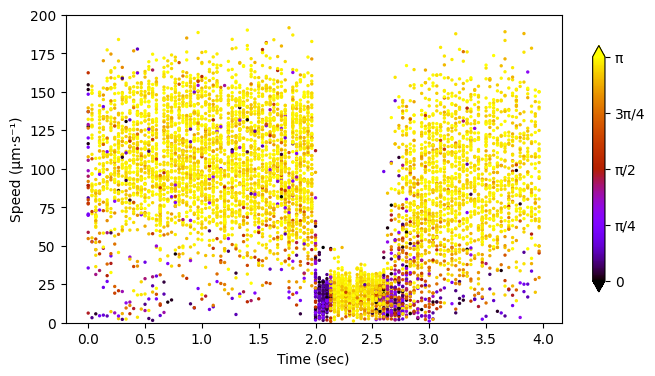

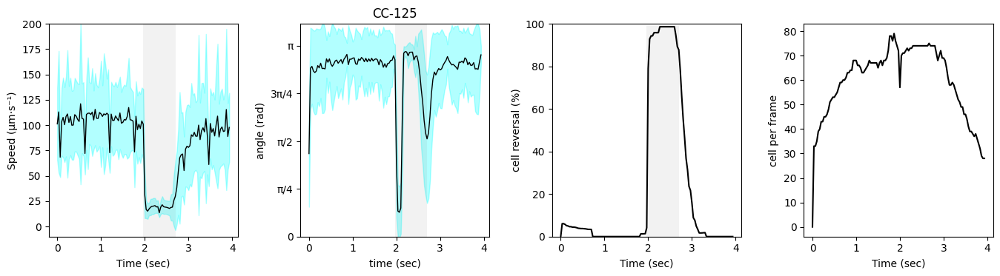

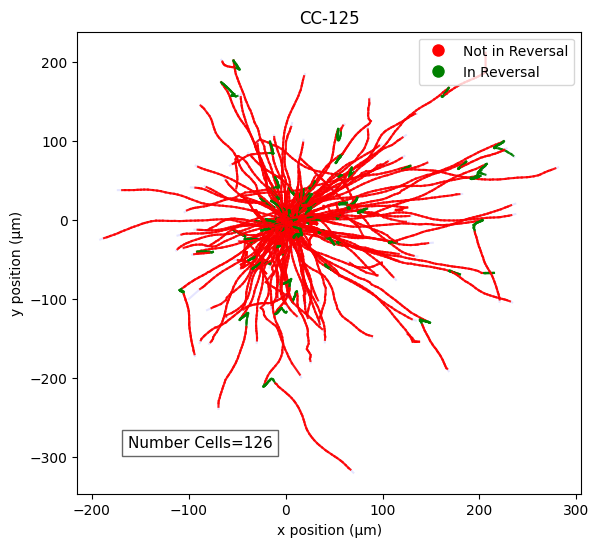



file:
10_05_CC-125_01.csv CC-125
--- 0.11686562299728394 minutes ---
Original Track List Length: 79
Short List Length: 25


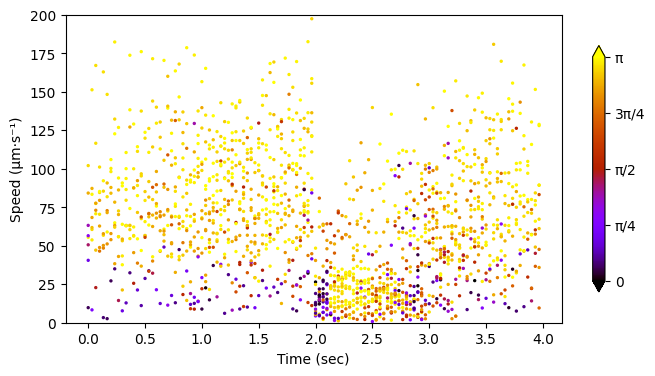

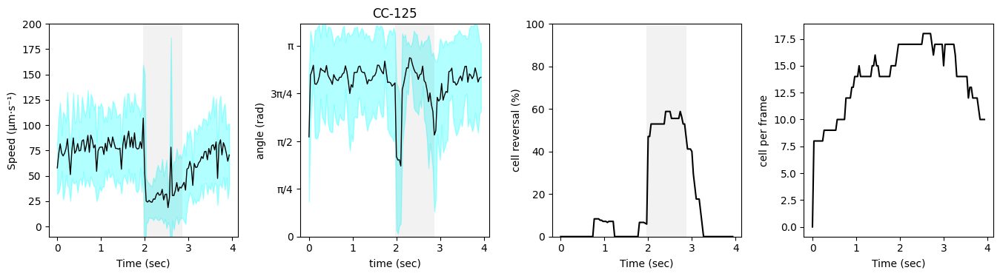

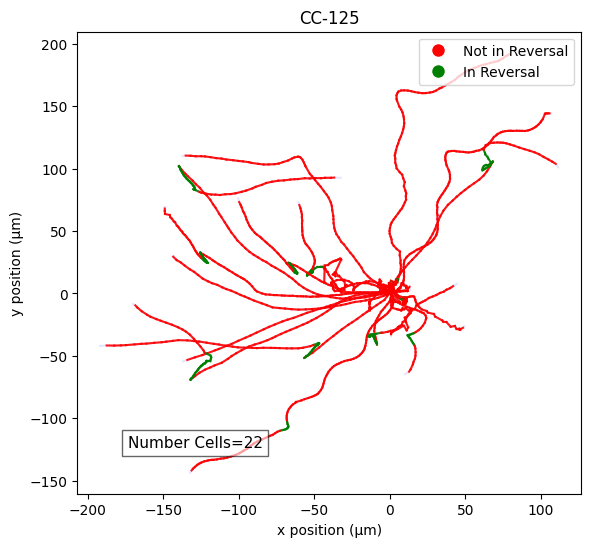



file:
10_05_CC-125_02.csv CC-125
--- 0.18624194065729777 minutes ---
Original Track List Length: 51
Short List Length: 13


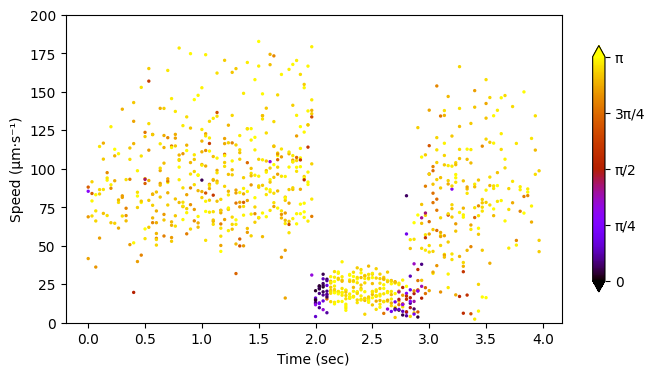

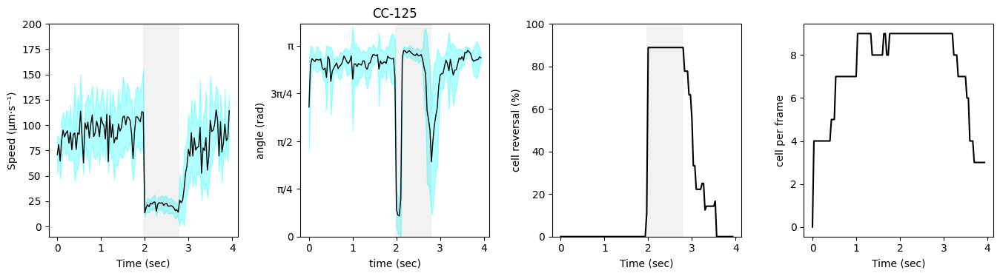

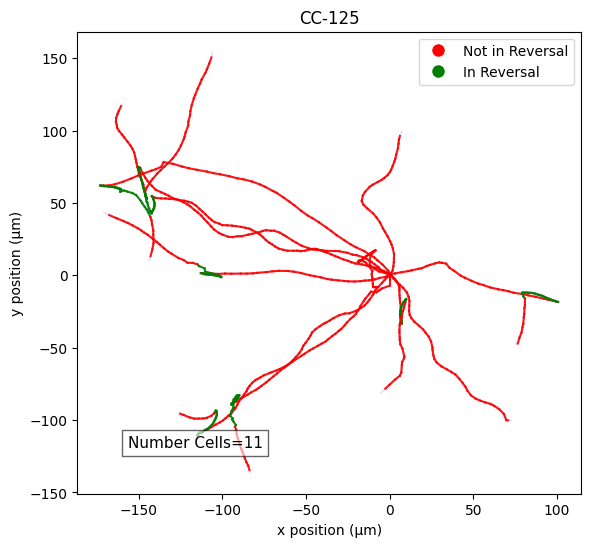



file:
09_28_ppr2_phototshock_01.csv ppr2
--- 0.2291501482327779 minutes ---
Original Track List Length: 669
Short List Length: 274
Reject the null hypothesis of Rayleigh circularity: Data is not uniformly distributed. May want to recollect data under uniform conditions or consider that movement/taxis is occuring


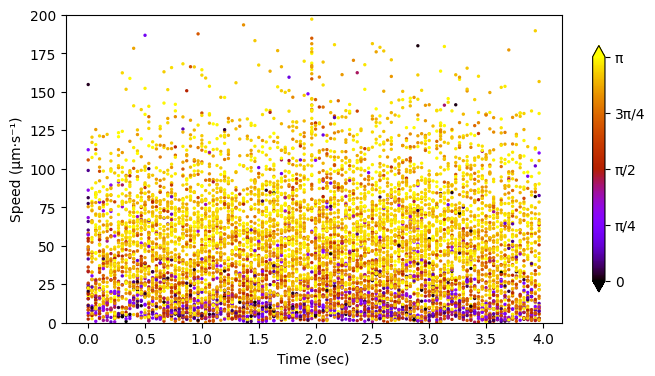

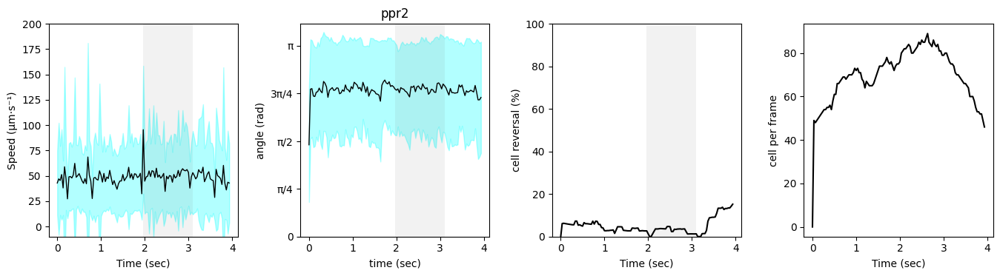

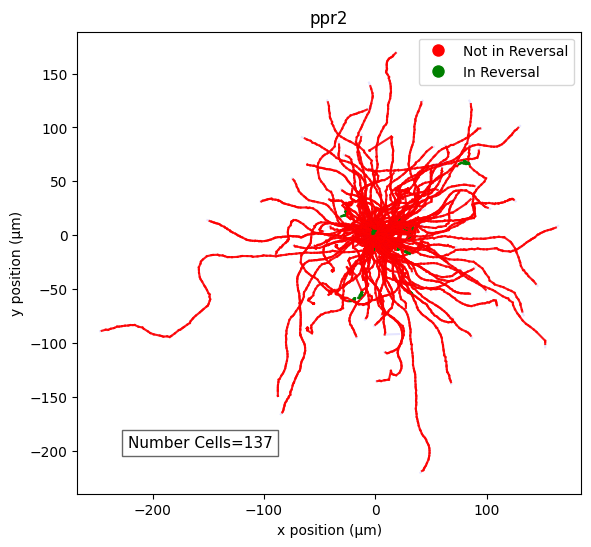



file:
09_28_ppr2_phototshock_02.csv ppr2
--- 0.4136663635571798 minutes ---
Original Track List Length: 822
Short List Length: 276
Reject the null hypothesis of Rayleigh circularity: Data is not uniformly distributed. May want to recollect data under uniform conditions or consider that movement/taxis is occuring


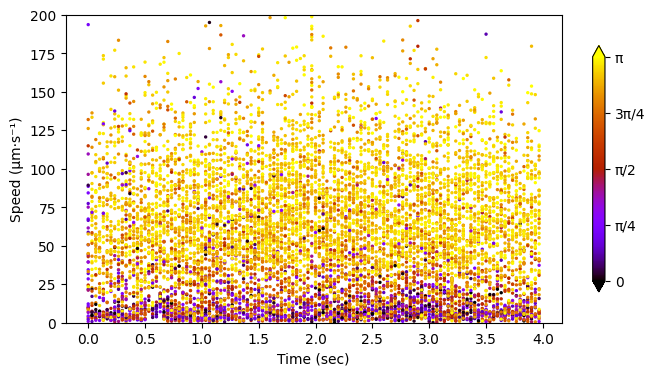

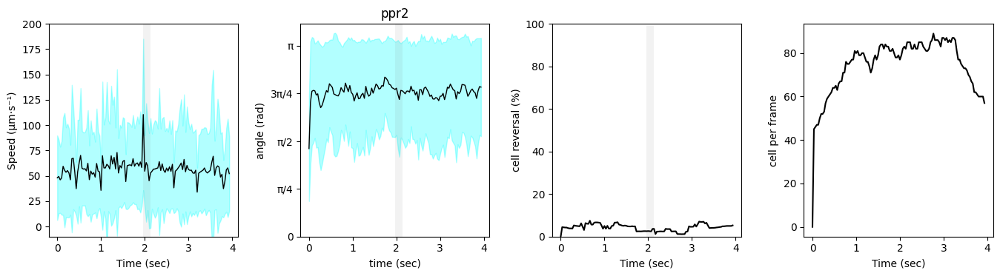

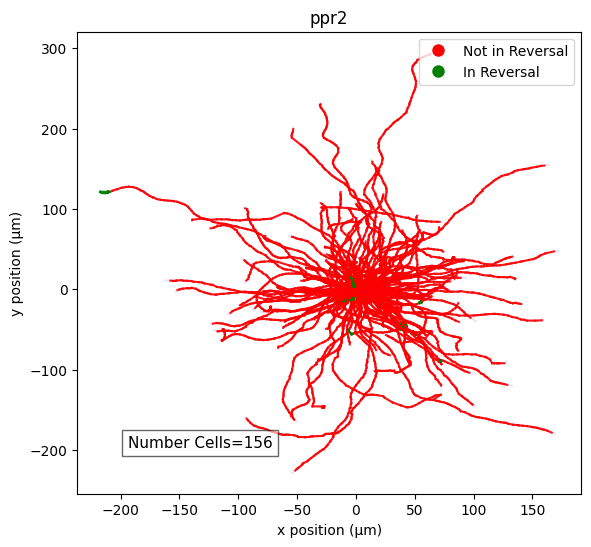



file:
09_28_ppr2_phototshock_03.csv ppr2
--- 0.6076732953389485 minutes ---
Original Track List Length: 1074
Short List Length: 362


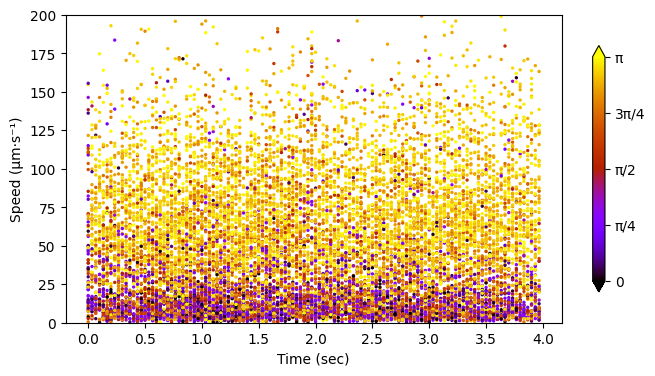

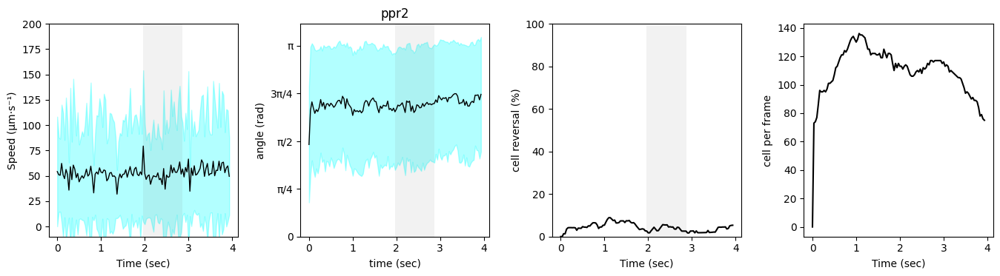

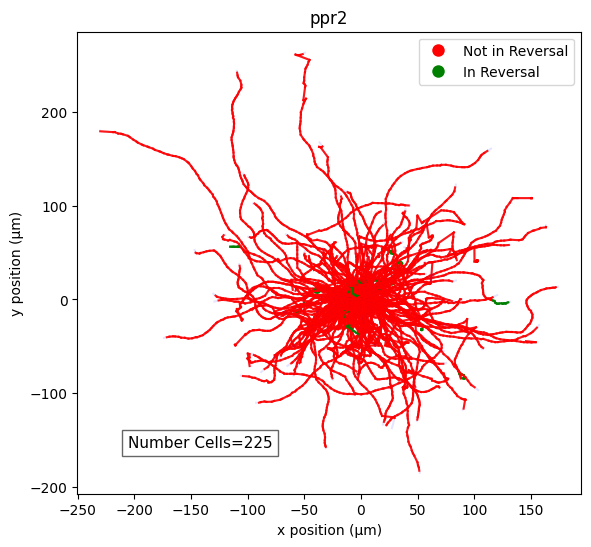

CC-125
ppr2
CC-125
ppr2
CC-125
ppr2


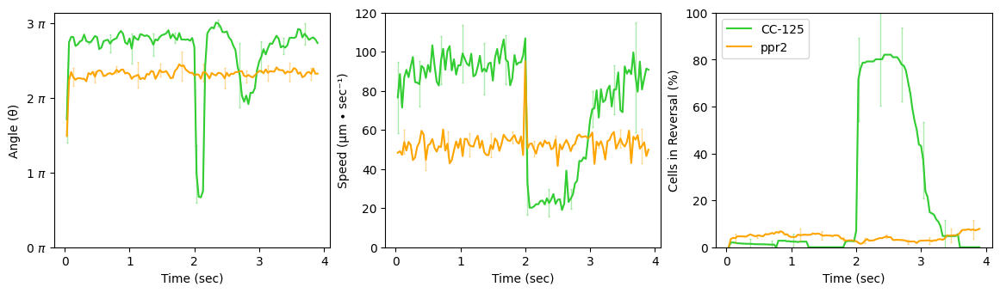

--- 0.9004960536956788 minutes ---
finished processing


In [7]:
#-----------------------------------------------------------------------------------------------------------------------
#optional dictionary converting file names into strain names
strainDict = {
    'shortname': 'adjusted name with any special characters'}
fileDictAll, color_dict, _ = import_file_names(strainDict=strainDict)  #importing file and strain names

# CODE DEFAULTS: #------------------------------------------------------------------------------------------------------

# here are global variables and parameters which will ALWAYS need to be adjusted for code to work
control = 'CC-125'
stat_test = 'ttest_ind'  # alternatively 'ks_2samp'

order=None #will determine the order of strains in plots, can be set retroactively in next blocks as well.
color_dict=None # (dict) setting cutom colors for strains in seaborn based plots, ex. color_dict
average_by= None # [options (str):  day, trial, None] if averaged by day will take the average
                    # of the data points taken on the same day with the same name, regardeless of video. 
                    # If by trial will take the aveage of each video. AKA are videos taken on the same day discrete, OR continous datasets?
                    # all average will be handled OUTSIDE of the master function, as non-average data is sometime requred. 
#-----------------------------------------------------------------------------------------------------------------------

#MASTER FUNCTION EXECUTION
df1, percents, cell_count_list, rayleigh_list, rayleigh_pvals, list_percent_during_shock= master_cell_track_process(
    max_color_speed=150, #Manually set color scale, useful when outlier skew scale
    colorBy='reversal', #OR speed, angle, reversal, or time
    strainDict=strainDict,
    control=control,
    stat_test=stat_test,
    order=order,
    PHOTOSHOCK=True, 
    RUN_GRAPH_TRACK=True,
    RUN_ROSE_PLOT_INDIVIDUAL=False)


#### POST DATA PROCESSING: Collapsing parameters into means for plotting

In [8]:
fileDict, colorDictStrain, _ = import_file_names(strainDict=strainDict) 

#dropping parameters that are time dependent as they are graphed seperately
dfHold = df1
dfHold = dfHold.drop(columns=['time elapsed', 'boolean indices']) #dropping time parameters
#Some stats generate tracks that are lists of lists, they are averaged out here
dfHold['speed'] = dfHold['speed'].apply(lambda x: sum(x) / len(x))
dfHold['angle'] = dfHold['angle'].apply(lambda x: sum(x) / len(x))
dfHold['segment directness'] = dfHold['segment directness'].apply(lambda x: sum(x) / len(x))

#averaging by video for stats
average_by='video'
if average_by=='video':
    dfHold = dfHold.select_dtypes(include='number')
    dfHold = dfHold.groupby('file').mean() #taking average by video
    dfHold['strain']=dfHold.index.map(fileDict) #taking averages get rid of this so must be remapped
if average_by=='day': 
    dfHold = dfHold.select_dtypes(include='number')
    splitString=dfHold.index.str.split('_')
    dfHold['dated groups'] = splitString.str[0] + '_' + splitString.str[1] + '_' + splitString.str[2]
    dfHold=(dfHold.groupby('dated groups').mean()) #taking average by video
    splitString=dfHold.index.str.split('_')
    dfHold['strain'] = splitString.str[2]
else: 
    hatches=None
    circ1=None

#### PRINTING DATA TABLE OUTPUT

In [9]:
styler, final_df = convert_to_table(dfHold,
                                    stat_test=stat_test,
                                    control=control,
                                    print_count=True,
                                    print_LaTex=False, 
                                    order=order)
display(styler)

#### PCA (Principal Component Analysis)

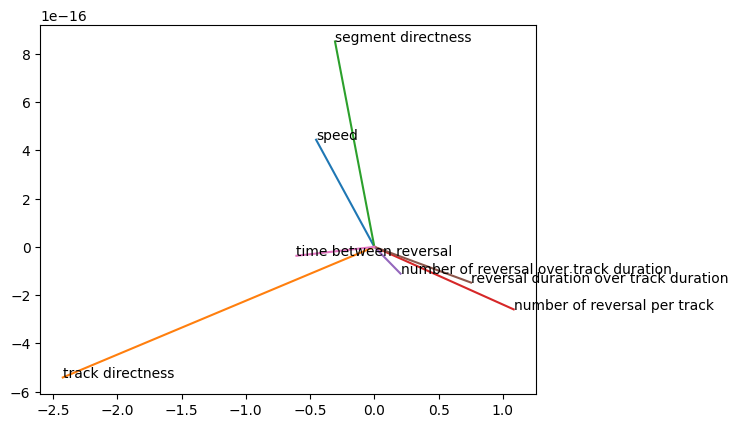

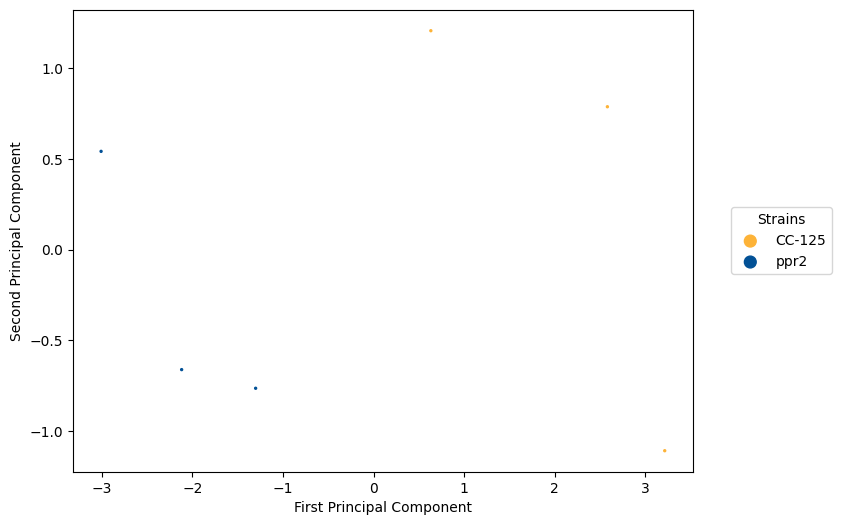

In [10]:
dfHold1=dfHold.drop(columns=['angle']) #not very useful for PCA almost always averages to 180
dfHold1= dfHold1.set_index('strain')
PCA_PLOT(dfHold1, colorDictStrain, fileDict)

#### ROSE PLOT 

C:\Users\lexis\AppData\Local\Temp\ipykernel_20492\2471671497.py:346: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_cmap = plt.cm.get_cmap('turbo')
C:\Users\lexis\AppData\Local\Temp\ipykernel_20492\2471671497.py:346: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  my_cmap = plt.cm.get_cmap('turbo')


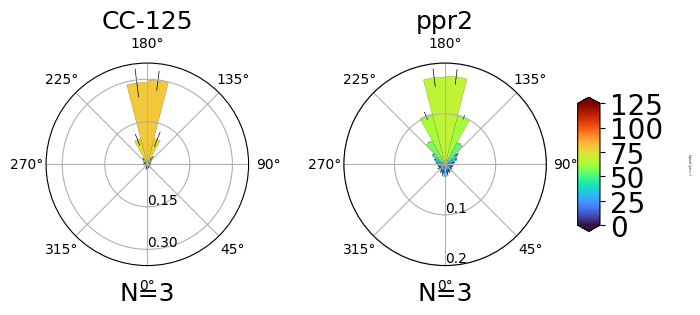

In [11]:
fileDict, colorDictStrain, strains = import_file_names(strainDict=strainDict) 
sizeX = 1
sizeY = 2
fig, ax1 = plt.subplots(sizeX, sizeY, figsize=(8 * sizeX, 8 * sizeY), subplot_kw={'projection': 'polar'})
plt.tight_layout(pad=4)
ax1 = fig.axes
df_hold = df1[['angle', 'speed', 'strain', 'time elapsed']]
count = 0

KSCompareS, KSCompareA = [], []

for n, grp in df_hold.groupby('strain'):
    ax = ax1[count]
    timeExplode = grp[['strain', 'time elapsed']].explode('time elapsed')
    speedExplode = grp[['strain', 'speed']].explode('speed')
    speedExplode = speedExplode.groupby('file')['speed'].apply(list)
    speedExplode = speedExplode.tolist()
    angleExplode = grp[['strain', 'angle']].explode('angle')
    angleExplode = angleExplode.groupby('file')['angle'].apply(list)
    angleExplode = angleExplode.tolist()
    cmap = rose_plot(angleExplode,
                     len(grp.index.unique()),
                     speedExplode,
                     bins=25,
                     density=None,
                     lab_unit="degrees",
                     colorbar_plot=False,
                     max_color_speed=125,
                     ax=ax)
    count += 1
    ax.set_title(n, fontdict={'size': 18})

cax, cbar_kwds = mpl.colorbar.make_axes(ax1,
                                        location='right',
                                        shrink=0.09,
                                        aspect=6)
bounds = ([0, 25, 50, 75, 100, 125])
cbar = mpl.colorbar.ColorbarBase(ax=cax,
                                 cmap=cmap,
                                 extend='both',
                                 spacing='proportional',
                                 norm=plt.Normalize(0, 125),
                                 ticks=bounds,
                                 orientation='vertical')

cbar.set_label('Speed (\u03BCm⋅s\u207B\u00B9)',
               rotation=270,
               labelpad=20,
               size=2)
cbar.ax.tick_params(labelsize=20)
plt.show()
fig.savefig('rose plot.png')

del df_hold

#### PHOTOSHOCK PLOT (only run this block if photoshock is flagged as True)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                 strain  cells in reversal (%)
file                                                          
09_22_CC-125_phototshock_03.csv  CC-125              91.690710
10_05_CC-125_01.csv              CC-125              52.555374
10_05_CC-125_02.csv              CC-125              85.777778
09_28_ppr2_phototshock_01.csv      ppr2               2.759801
09_28_ppr2_phototshock_02.csv      ppr2               2.742835
09_28_ppr2_phototshock_03.csv      ppr2               3.753885


C:\Users\lexis\AppData\Local\Temp\ipykernel_20492\2973971670.py:348: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


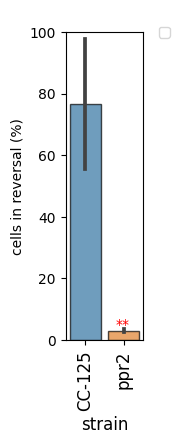

In [12]:
print(list_percent_during_shock)
ax = formatted_sns_with_stats(list_percent_during_shock, plotting='cells in reversal (%)', groupBy='strain',
                              color_dict=color_dict, stat_test=stat_test, control='CC-125', plot_type=['barplot'], order=order)
ax.set_ylim([0,100])
plt.show()

#### RAYLEIGH CIRCULARITY PLOT

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


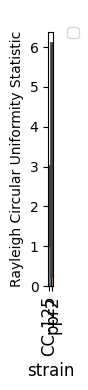

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


C:\Users\lexis\AppData\Local\Temp\ipykernel_20492\2973971670.py:348: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


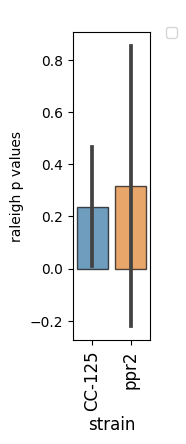

In [13]:
#rayleigh_list = rayleigh_list.drop('hue', axis=1)
ax = formatted_sns_with_stats(rayleigh_list, plotting='Rayleigh Circular Uniformity Statistic',
                              groupBy='strain', stat_test=stat_test, control=control, plot_type='barplot', order=order)
plt.show() 
#-----------------------------------------------------------------------------------------------------------------------------------------
ax = formatted_sns_with_stats(rayleigh_pvals, plotting='raleigh p values', groupBy='strain',  stat_test=stat_test, control=control, plot_type='barplot', order=order)
plt.show() 

#### CELL COUNT PLOT

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


C:\Users\lexis\AppData\Local\Temp\ipykernel_20492\2973971670.py:348: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


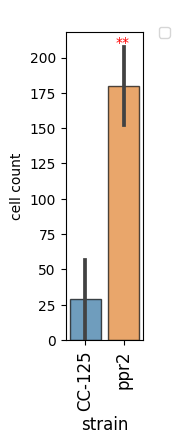

In [14]:
cell_count_list_hold=cell_count_list
cell_count_list=cell_count_list_hold
cell_count_list['cell count'] = cell_count_list['cell count'].apply(lambda x: sum(x) / len(x) if x is not list else x)
ax = formatted_sns_with_stats(cell_count_list, plotting='cell count', groupBy='strain',
                             color_dict=color_dict, stat_test=stat_test, control=control, plot_type='barplot', order=order)
plt.show()  


#### PERCENT MOVING PLOT

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


C:\Users\lexis\AppData\Local\Temp\ipykernel_20492\2973971670.py:348: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


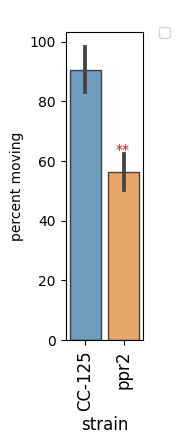

In [15]:
ax = formatted_sns_with_stats(percents, plotting='percent moving', groupBy='strain',
                             color_dict=None, stat_test=stat_test, control=control, plot_type='barplot', order=order)
plt.show()  


#### INDIVIDUAL PLOTS (speed, directness, etc)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


C:\Users\lexis\AppData\Local\Temp\ipykernel_20492\2973971670.py:348: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


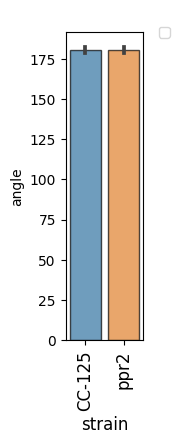

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


C:\Users\lexis\AppData\Local\Temp\ipykernel_20492\2973971670.py:348: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


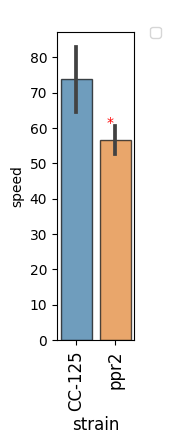

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


C:\Users\lexis\AppData\Local\Temp\ipykernel_20492\2973971670.py:348: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


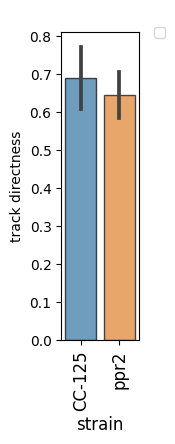

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


C:\Users\lexis\AppData\Local\Temp\ipykernel_20492\2973971670.py:348: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


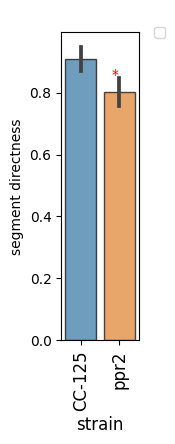

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


C:\Users\lexis\AppData\Local\Temp\ipykernel_20492\2973971670.py:348: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


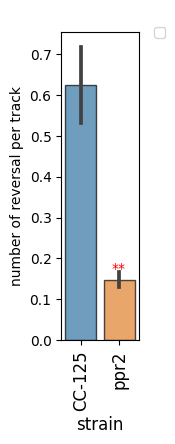

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


C:\Users\lexis\AppData\Local\Temp\ipykernel_20492\2973971670.py:348: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


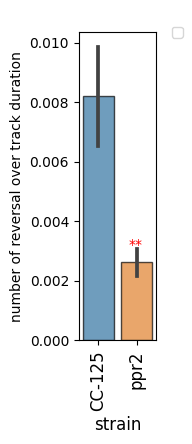

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


C:\Users\lexis\AppData\Local\Temp\ipykernel_20492\2973971670.py:348: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


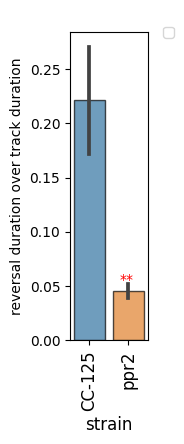

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


C:\Users\lexis\AppData\Local\Temp\ipykernel_20492\2973971670.py:348: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


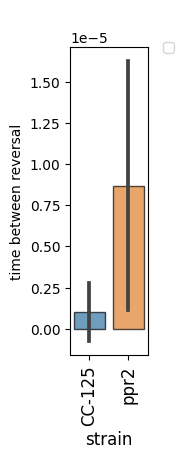

In [16]:
#individual plots
loop = list(dfHold.columns.values)
delete_columns = dfHold.select_dtypes(include=['object']).columns.tolist()
delete_columns2 = dfHold.select_dtypes(include='number').columns.tolist()
loop = [e for e in loop if e not in delete_columns] #only numeric data
loop = [e for e in loop if e in delete_columns2]
dfHold['strain'] = dfHold.index.map(fileDict) 
for category in loop:
    dfHold1 = dfHold[[category, 'strain']]
    ax = formatted_sns_with_stats(dfHold1, plotting=category, groupBy='strain', 
                              color_dict=color_dict, stat_test=stat_test, control=control, plot_type=['barplot'], order=order)
    plt.show()